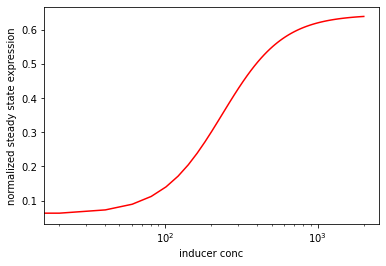

In [12]:
import numpy as np
from matplotlib import pyplot as plt

def hill(X, n, Km, v, y0):
    '''
    :param X: Concentration of molecule X
    :param n: hill coefficient
    :param Km: half expression concentration
    :param v: v_max
    '''
    return (v * X**n / (Km ** n + X ** n)) + y0

def hill_3d(x, y, n1, Km1, v1, n2, Km2, v2):
    return hill(x, n1, Km1, v1) * hill(y, n2, Km2, v2)

def plot_hill(x, y, color = 'r'):
    plt.plot(inducer1, cell_ratio, color='r')
    plt.xscale('log')
    plt.xlabel('inducer conc')
    plt.ylabel('normalized steady state expression')

    
def plot_3dhill(x, y, n1, Km1, v1, n2, Km2, v2):
    hill = np.zeros((len(x), len(y)))
    for i in range(len(x)):
        for j in range(len(y)):
            hill[i,j] = hill_3d(i, j, n1, Km1, v1, n2, Km2, v2)
    fig, ax = plt.subplots()
    
    ax.imshow(hill)
    ax.set_xlabel('dox')
    ax.set_ylabel('aba')
    
    
#dox is 0 - 2000, aba is 0 - 150
inducer1 = np.linspace(0, 2000, 100)
inducer2 = np.linspace(0, 150, 100)
cell_ratio = np.zeros(100)

Km1 = 17.6966
n1 = 2.1742
v1 = .5829
y0 = 0.0609

Km2 = 3
n2 = 2
# v2 = 1
# for i in range(len(inducer1)):
#     cell_ratio[i] = hill(inducer1[i], n1, Km1, v1) * hill(inducer2[i], n2, Km2, v2)
    
cell_ratio = hill(inducer2, n1, Km1, v1, y0)
plot_hill(inducer2, cell_ratio)

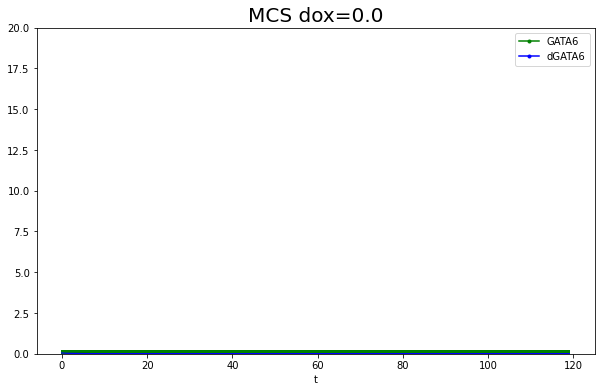

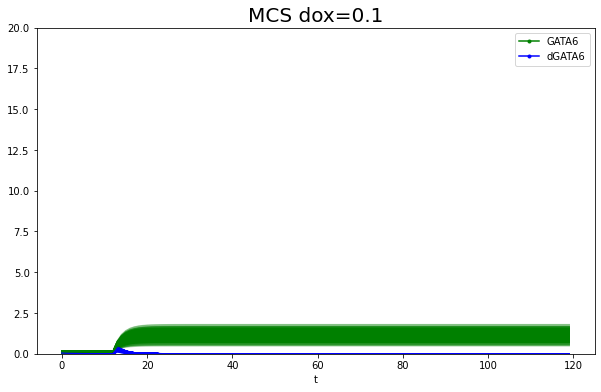

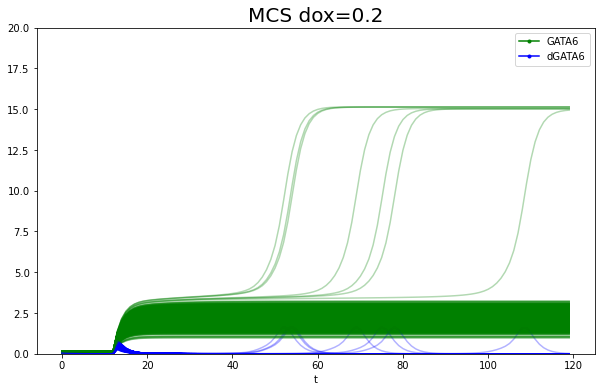

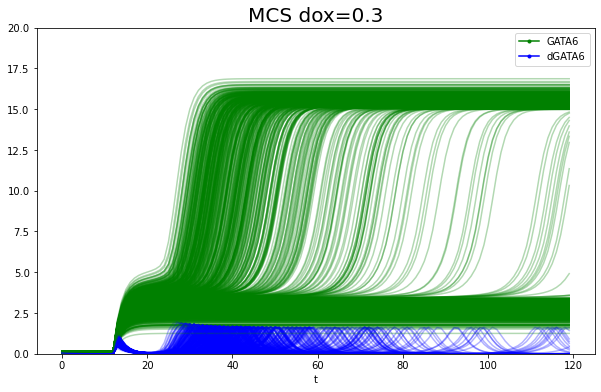

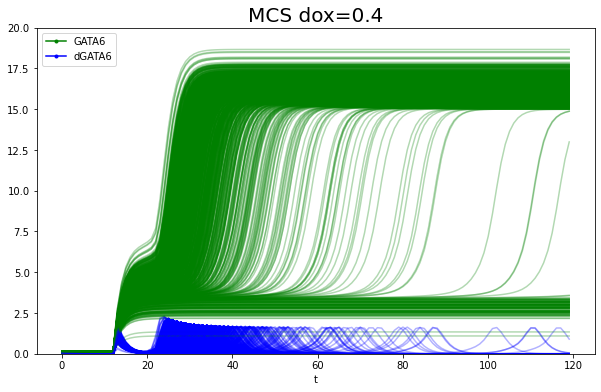

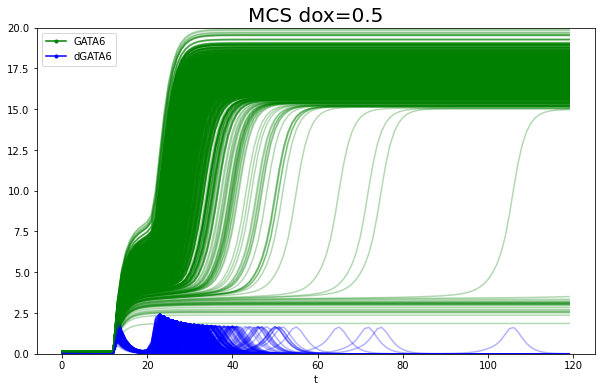

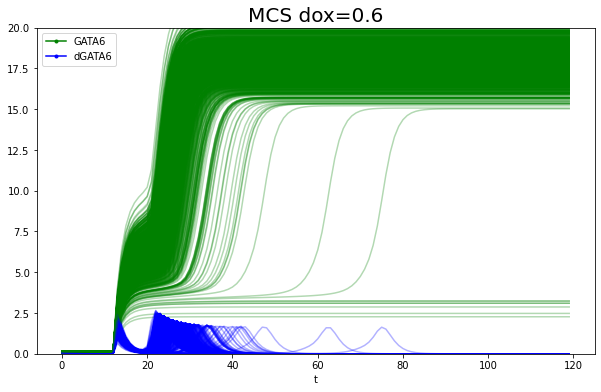

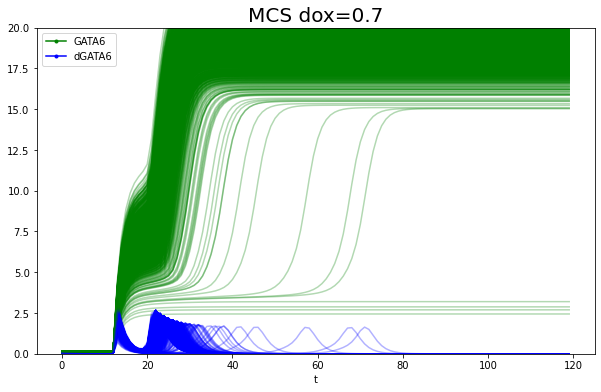

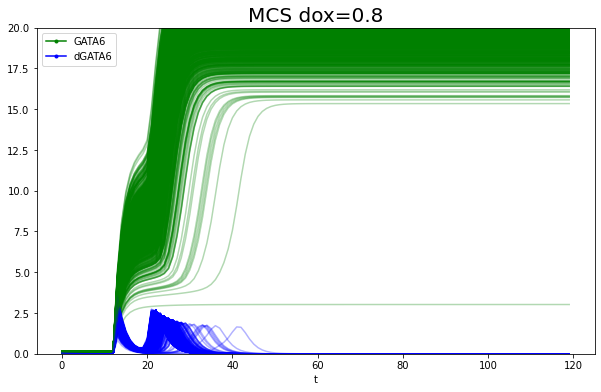

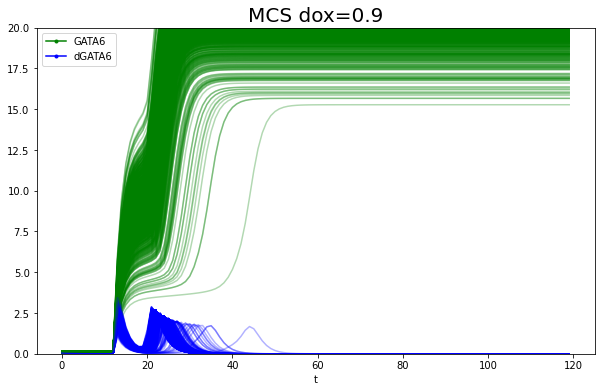

In [9]:
import numpy as np
from scipy import integrate
from matplotlib import pyplot as plt
from matplotlib.legend_handler import HandlerLine2D


'''
EUNBI'S NANOG-GATA6 MODEL
We observe few differences in dgata6 due to the dominating hill-like equation in the system
'''

def change_alpha(handle, original):
    ''' Change the alpha and marker style of the legend handles '''
    handle.update_from(original)
    handle.set_alpha(1)
    handle.set_marker('.')

def dnanog(NANOG, GATA6, a1, a2, a3, a4, a5):
    return (1 + a1 * NANOG ** a2)/(1 + NANOG ** a2) * (1 + a3 * GATA6 ** a4) / (1 + GATA6 ** a4) - a5 * NANOG

def dgata6_end(NANOG, GATA6, a1, a2, a3, a4, a5):
    return (1 + a1 * GATA6 ** a2)/(1 + GATA6 ** a2) * (1 + a3 * NANOG ** a4) / (1 + NANOG ** a4) - a5 * GATA6

def dgata6_syn(dox, p, GATA6, a6):
    return dox * p - GATA6 * a6

def dudt(U, t, dox, p):
    NANOG, GATA6, GATA6_end, GATA6_syn = U
    a1 = 6
    a2 = 3.5
    a3 = 0.01
    a4 = 1.5
    a5 = 0.4

    b1 = 6
    b2 = 2.5
    b3 = 0.07
    b4 = 3.5
    b5 = 0.5
    b6 = 0.5

    d = 0
    if t > 12:
        d = dox
    dnanog_dt = dnanog(NANOG, GATA6, a1, a2, a3, a4, a5)
    dgata6_end_dt = dgata6_end(NANOG, GATA6_end, b1, b2, b3, b4, b5)
    dgata6_syn_dt = dgata6_syn(d, p, GATA6_syn, b6)
    return dnanog_dt, dgata6_end_dt + dgata6_syn_dt, dgata6_end_dt, dgata6_syn_dt

def du_dt(U, t, dox, p):
    NANOG, GATA6, GATA6_end, GATA6_syn = U
    a1 = 6
    a2 = 3.5
    a3 = 0.01
    a4 = 1.5
    a5 = 0.4

    b1 = 6
    b2 = 2.5
    b3 = 0.07
    b4 = 3.5
    b5 = 0.5
    b6 = 0.5

    d = np.zeros(len(t))
    d[t > 12] = dox
    dnanog_dt = dnanog(NANOG, GATA6, a1, a2, a3, a4, a5)
    dgata6_end_dt = dgata6_end(NANOG, GATA6_end, b1, b2, b3, b4, b5)
    dgata6_syn_dt = dgata6_syn(d, p, GATA6_syn, b6)
    return dnanog_dt, dgata6_end_dt + dgata6_syn_dt, dgata6_end_dt, dgata6_syn_dt
dox = np.arange(0, 1, 0.1)
for value in dox:
    num_cells = 1000
    t = np.arange(0, 120, 1)
    

    GATA6 = np.zeros((num_cells, len(t)))
    GATA6_syn = np.zeros((num_cells, len(t)))
    GATA6_end = np.zeros((num_cells, len(t)))
    NANOG = np.zeros((num_cells, len(t)))
    
    dGATA6 = np.zeros((num_cells, len(t)))
    for i in range(num_cells):
        p = np.random.normal(5)
        nanog_initial = np.random.normal(14)
        gata6_end_initial = np.random.rand() * 0.15
        gata6_syn_initial = 0
        gata6_initial = gata6_end_initial + gata6_syn_initial
        values = integrate.odeint(dudt, [nanog_initial, gata6_initial, gata6_end_initial, gata6_syn_initial], t, args=(value, p))
        NANOG[i,:], GATA6[i,:], GATA6_end[i,:], GATA6_syn[i,:] = values[:,0], values[:,1], values[:,2], values[:,3]
        dGATA6[i,:] = du_dt([NANOG[i,:], GATA6[i,:], GATA6_end[i,:], GATA6_syn[i,:]], t, value, p)[1]

            
    ddGATA6 = np.diff(dGATA6, axis=1)
    fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
    for i in range(num_cells):
        ax.plot(t, GATA6[i,:], color='g', alpha=0.3)
        #ax.plot(t, NANOG[i,:], color ='r', alpha=0.1)
        ax.plot(t, dGATA6[i,:], color='blue', alpha=0.3)
        #ax.plot(t[1:] ddGATA6, color='r', alpha=0.3)
    ax.set_title(f'MCS dox={value:.1f}', fontsize=20)
    ax.set_ylim([0, 20])
    ax.set_xlabel('t')
    #plt.legend(['GATA6','dGATA6', 'ddGATA6'], handler_map={plt.Line2D: HandlerLine2D(update_func=change_alpha)})
    plt.legend(['GATA6','dGATA6'], handler_map={plt.Line2D: HandlerLine2D(update_func=change_alpha)})




In [2]:
import numpy as np
from scipy import integrate
from matplotlib import pyplot as plt
from matplotlib.legend_handler import HandlerLine2D


'''
NANOG-GATA6 MODEL with separated protein and rna
We observe few differences in dgata6 due to the dominating hill-like equation in the system
'''

def change_alpha(handle, original):
    ''' Change the alpha and marker style of the legend handles '''
    handle.update_from(original)
    handle.set_alpha(1)
    handle.set_marker('.')

def dnanog_rna(nanog, NANOG, GATA6, a1, a2, a3, n, m, KM_NN, KM_GN):
    return (a1 * NANOG ** n)/(KM_NN ** n + NANOG ** n) * (a2 * KM_GN ** m)/(KM_GN ** m + GATA6 ** m) - a3 * nanog

def dgata6_rna(gata6, NANOG, GATA6, dox, p, a1, a2, a3, n, m, KM_GG, KM_NG):
    return dox * p + (a1 * GATA6 ** n)/(KM_GG ** n + GATA6 ** n) * (a2 * KM_NG ** m)/(KM_NG ** m + NANOG ** m) - a3 * gata6

def dNANOG(NANOG, nanog, a1, a2):
    return a1 * nanog - a2 * NANOG

def dGATA6(GATA6, gata6, a1, a2):
    return a1 * gata6 - a2 * GATA6

def dudt(U, t, dox, p):
    nanog, gata6, NANOG, GATA6 = U
    a1 = 4
    b1 = 4
    a2 = 4
    b2 = 4
    a3 = 0.5
    b3 = 0.5
    KM_NN, KM_GN, KM_GG, KM_NG = [5, 5, 5, 5]
    n = m = 4

    protein_degradation_rate = 0.125
    translation_rate = 0.167

    d = 0
    if t > 12:
        d = dox
    dnanog_dt = dnanog_rna(nanog, NANOG, GATA6, a1, a2, a3, n, m, KM_NN, KM_GN)
    dgata6_dt = dgata6_rna(gata6, NANOG, GATA6, d, p, b1, b2, b3, n, m, KM_GG, KM_NG)
    dGATA6_dt = dGATA6(GATA6, gata6, translation_rate, protein_degradation_rate)
    dNANOG_dt = dNANOG(NANOG, nanog, translation_rate, protein_degradation_rate)
    return dnanog_dt, dgata6_dt, dNANOG_dt, dGATA6_dt


def du_dt(U, t, dox, p):
    nanog, gata6, NANOG, GATA6 = U
    a1 = 4
    b1 = 4
    a2 = 4
    b2 = 4
    a3 = 0.5
    b3 = 0.5
    KM_NN, KM_GN, KM_GG, KM_NG = [5, 5, 5, 5]
    n = m = 4

    protein_degradation_rate = 0.125
    translation_rate = 0.167

    d = np.zeros(len(t))
    d[t > 12] = dox
    dnanog_dt = dnanog_rna(nanog, NANOG, GATA6, a1, a2, a3, n, m, KM_NN, KM_GN)
    dgata6_dt = dgata6_rna(gata6, NANOG, GATA6, d, p, b1, b2, b3, n, m, KM_GG, KM_NG)
    dGATA6_dt = dGATA6(GATA6, gata6, translation_rate, protein_degradation_rate)
    dNANOG_dt = dNANOG(NANOG, nanog, translation_rate, protein_degradation_rate)
    return dnanog_dt, dgata6_dt, dNANOG_dt, dGATA6_dt

dox = np.arange(0, 1, 0.1)
list_GATA6 = []
list_gata6_rna = []
list_NANOG = []
list_nanog_rna = []
list_dGATA6_dt = []

tf = 240
#dox = [0]
for value in dox:
    num_cells = 1000
    t = np.arange(0, tf, 1)
    

    GATA6 = np.zeros((num_cells, len(t)))
    gata6_rna = np.zeros((num_cells, len(t)))
    nanog_rna = np.zeros((num_cells, len(t)))
    NANOG = np.zeros((num_cells, len(t)))
    
    dGATA6_dt = np.zeros((num_cells, len(t)))
    for i in range(num_cells):
        p = np.random.uniform(2, 16)
        nanog_initial = np.random.normal(32)
        #nanog_initial = np.random.normal(3)
        gata6_initial = np.random.rand() * 0.15
        NANOG_initial = 43
        GATA6_initial = 0
        values = integrate.odeint(dudt, [nanog_initial, gata6_initial, NANOG_initial, GATA6_initial], t, args=(value, p))
        nanog_rna[i,:], gata6_rna[i,:], NANOG[i,:], GATA6[i,:] = values[:,0], values[:,1], values[:,2], values[:,3]
        dGATA6_dt[i,:] = du_dt([nanog_rna[i,:], gata6_rna[i,:], NANOG[i,:], GATA6[i,:]], t, value, p)[3]
    list_GATA6.append(GATA6)
    list_gata6_rna.append(gata6_rna)
    list_NANOG.append(NANOG)
    list_nanog_rna.append(nanog_rna)
    list_dGATA6_dt.append(dGATA6_dt)

/var/folders/r7/4_plhr655910h6030ggc09100000gn/T/ipykernel_59143/239938914.py:30: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')


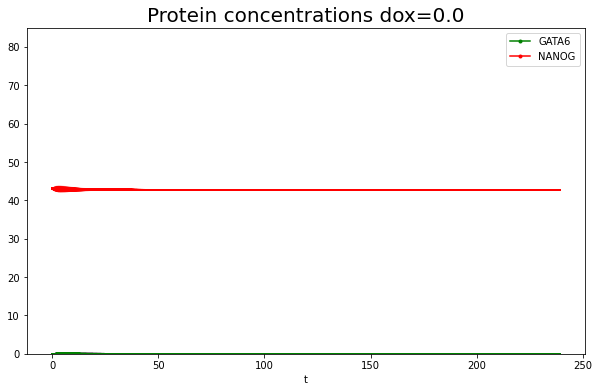

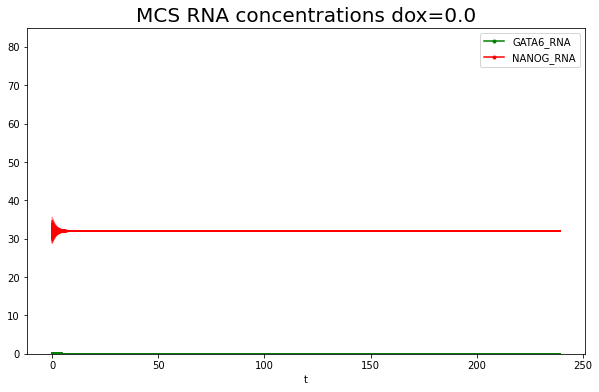

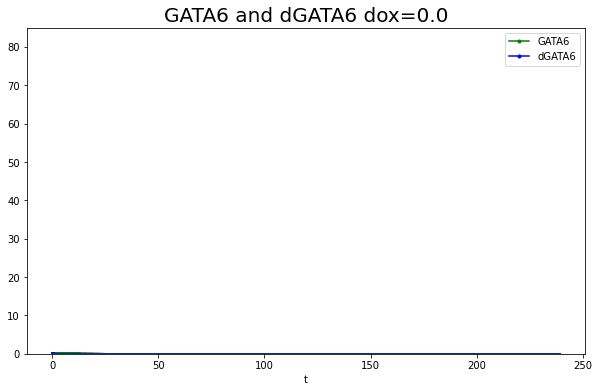

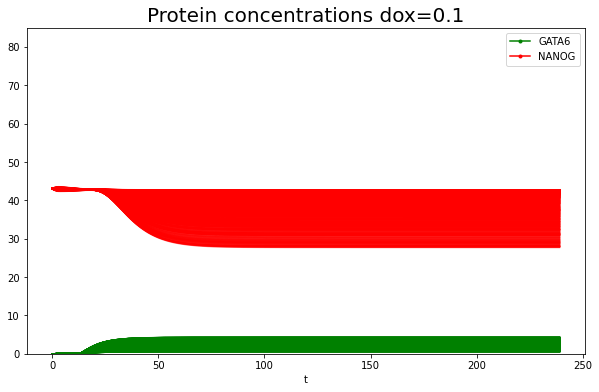

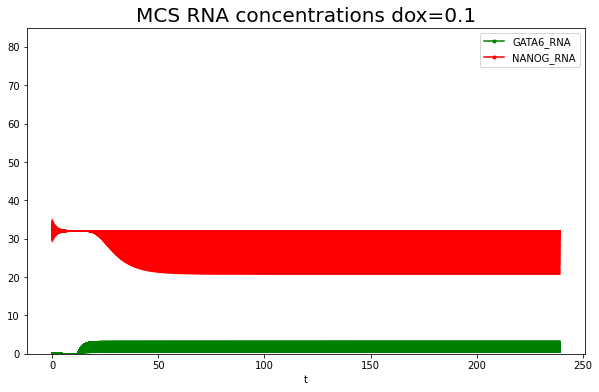

...

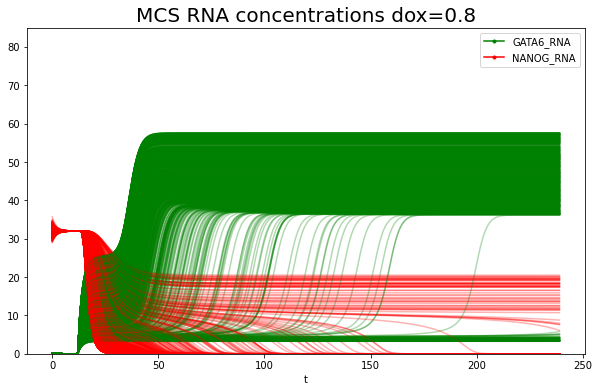

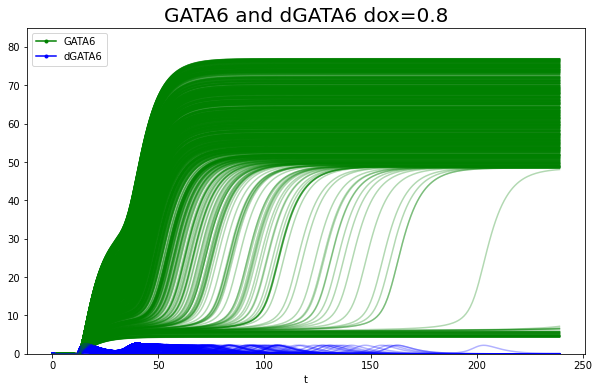

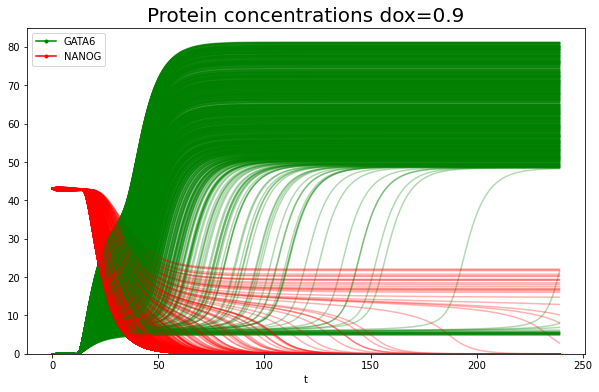

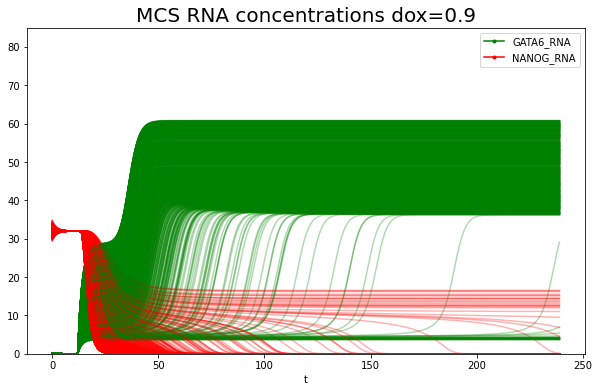

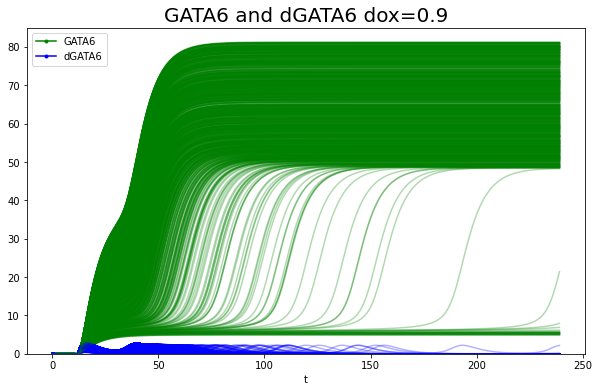

In [5]:
dox = np.arange(0, 1, 0.1)
for j in range(len(list_GATA6)):
    GATA6 = list_GATA6[j]
    NANOG = list_NANOG[j]
    gata6_rna = list_gata6_rna[j]
    nanog_rna = list_nanog_rna[j]
    dGATA6_dt = list_dGATA6_dt[j]
    fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
    for i in range(num_cells):
        ax.plot(t, GATA6[i,:], color='g', alpha=0.3)
        ax.plot(t, NANOG[i,:], color ='r', alpha=0.3)
    ax.set_title(f'Protein concentrations dox={dox[j]:.1f}', fontsize=20)
    ax.set_ylim([0, 85])
    ax.set_xlabel('t')
    plt.legend(['GATA6','NANOG'], handler_map={plt.Line2D: HandlerLine2D(update_func=change_alpha)})
    plt.savefig(f'./ode_figures/gata6vsnanog_prot_dox={dox[j]:.1f}.png')
    
    fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
    for i in range(num_cells):
        ax.plot(t, gata6_rna[i,:], color='g', alpha=0.3)
        ax.plot(t, nanog_rna[i,:], color ='r', alpha=0.3)
        #ax.plot(t, dGATA6_dt[i,:], color='blue', alpha=0.3)
        #ax.plot(t[1:] ddGATA6, color='r', alpha=0.3)
    ax.set_title(f'RNA concentrations dox={dox[j]:.1f}', fontsize=20)
    ax.set_ylim([0, 85])
    ax.set_xlabel('t')
    plt.legend(['GATA6_RNA', 'NANOG_RNA'], handler_map={plt.Line2D: HandlerLine2D(update_func=change_alpha)})
    plt.savefig(f'./ode_figures/gata6vsnanog_rna_dox={dox[j]:.1f}.png')
    
    fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
    for i in range(num_cells):
        ax.plot(t, GATA6[i,:], color='g', alpha=0.3)
        ax.plot(t, dGATA6_dt[i,:], color ='blue', alpha=0.3)
    ax.set_title(f'GATA6 and dGATA6 dox={dox[j]:.1f}', fontsize=20)
    ax.set_ylim([0, 85])
    ax.set_xlabel('t')
    plt.legend(['GATA6', 'dGATA6'], handler_map={plt.Line2D: HandlerLine2D(update_func=change_alpha)})
    plt.savefig(f'./ode_figures/GATA6vsdGATA6_dox={dox[j]:.1f}.png')

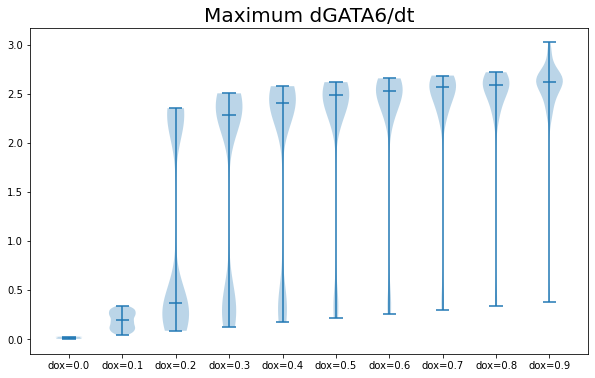

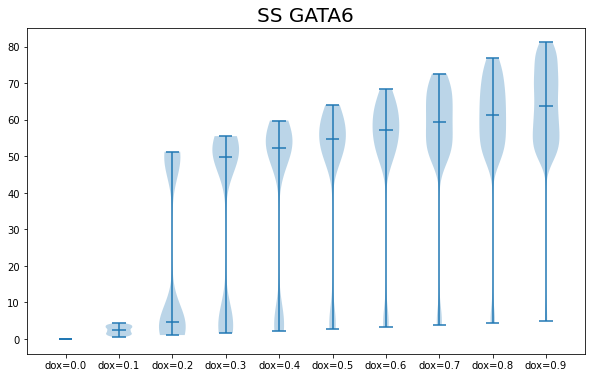

In [6]:
def write_legend(dox_values):
    a = []
    for i in dox_values:
        a.append(f'dox={i:.1f}')
    return a
dox = np.arange(0, 1, 0.1)
fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
#kwargs = dict(lw=0, alpha=0.5, bins=50, histtype='bar', stacked=True, range=[2,3])
max_dt = []
for dGATA6_dt in list_dGATA6_dt:
    max_dt.append(np.max(dGATA6_dt, axis=1))
ax.violinplot(max_dt, showmeans=False,showmedians=True)
plt.xticks([y + 1 for y in range(len(max_dt))], labels=write_legend(dox))
ax.set_title(f'Maximum dGATA6/dt', fontsize=20)
plt.savefig(f'./ode_figures/max_dgata6_violin.png')

fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
#kwargs = dict(lw=0, alpha=0.5, bins=50, histtype='bar', stacked=True, range=[2,3])
ss_gata = []
for GATA6 in list_GATA6:
    ss_gata.append(GATA6[:,-1])

ax.violinplot(ss_gata, showmeans=False,showmedians=True)
plt.xticks([y + 1 for y in range(len(ss_gata))], labels=write_legend(dox))
ax.set_title(f'SS GATA6', fontsize=20)
plt.savefig(f'./ode_figures/ss_dgata6_violin.png')

Text(0.5, 1.0, 'dGATA6/dt dox=0.9')

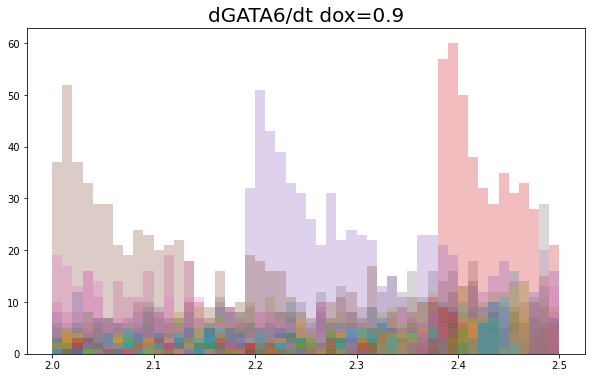

In [4]:
fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
num = 9
dox = list_dGATA6_dt[num]
for col in range(dox.shape[1]):
    ax.hist(dox[:,col], bins=50, alpha=0.3, range=[2,2.5])
ax.set_title(f'dGATA6/dt dox=0.{num}', fontsize=20)

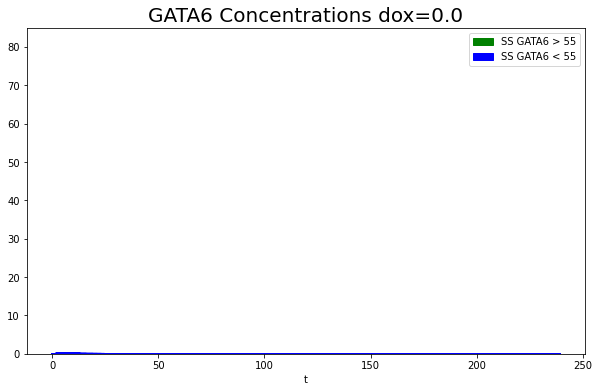

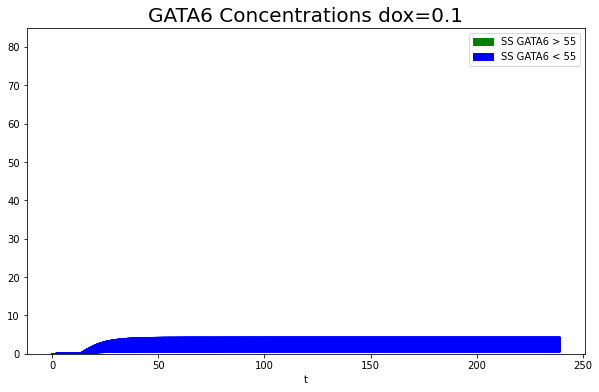

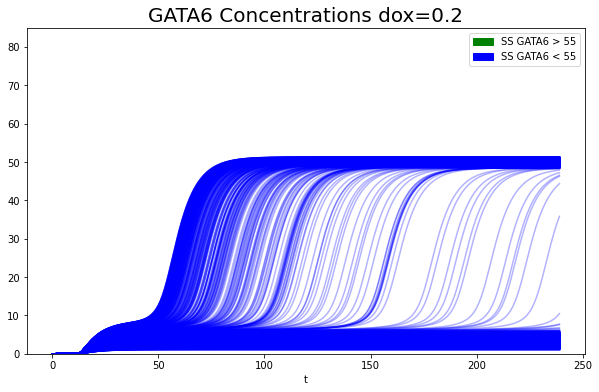

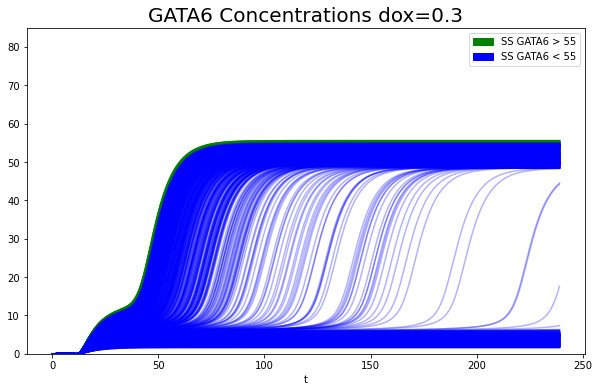

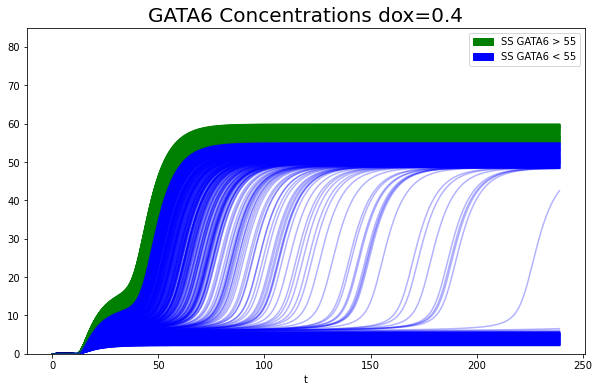

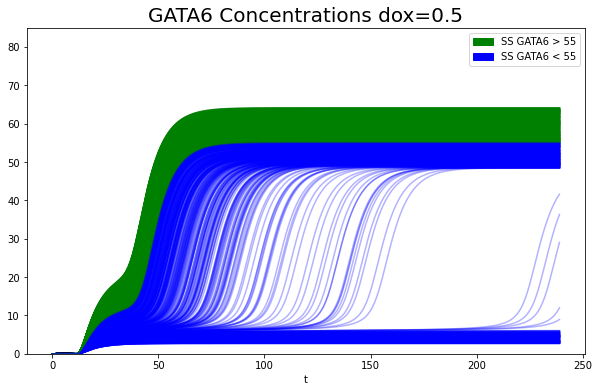

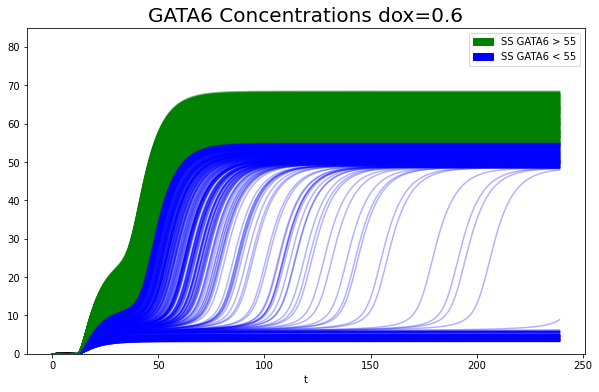

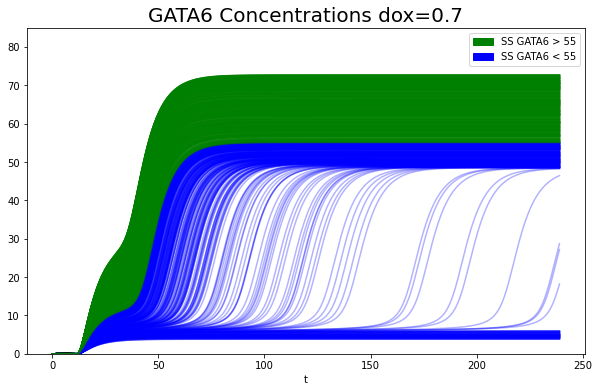

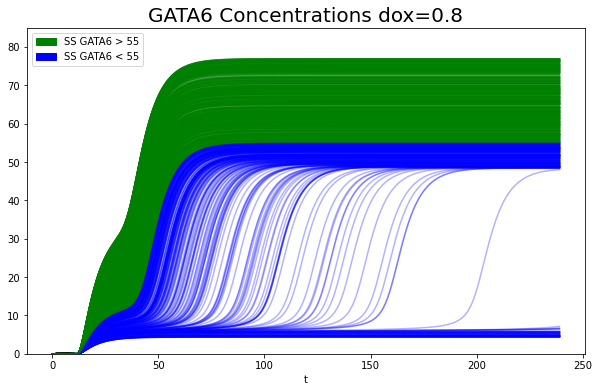

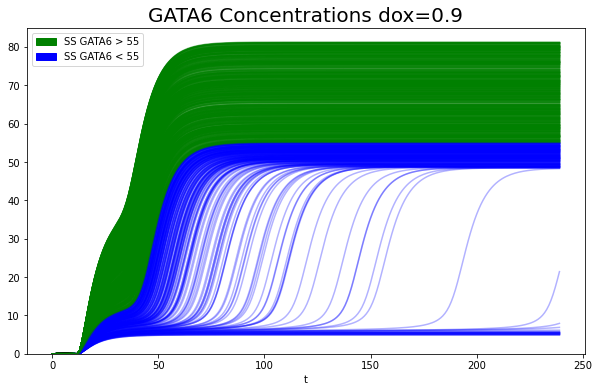

In [7]:
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt

blue = mpatches.Patch(color='blue', label='SS GATA6 < 55')
green = mpatches.Patch(color='green', label='SS GATA6 > 55')

dox = np.arange(0, 1, 0.1)
for j in range(len(list_GATA6)):
    GATA6 = list_GATA6[j]
    NANOG = list_NANOG[j]
    gata6_rna = list_gata6_rna[j]
    nanog_rna = list_nanog_rna[j]
    dGATA6_dt = list_dGATA6_dt[j]
    
    fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
    for i in range(num_cells):
        if GATA6[i,-1] > 55:
            ax.plot(t, GATA6[i,:], color='g', alpha=0.3)
        else:
            ax.plot(t, GATA6[i,:], color ='blue', alpha=0.3)
    ax.set_title(f'GATA6 Concentrations dox={dox[j]:.1f}', fontsize=20)
    ax.set_ylim([0, 85])
    ax.set_xlabel('t')
    ax.legend(handles=[green, blue], handler_map={plt.Line2D: HandlerLine2D(update_func=change_alpha)})
    plt.savefig(f'./ode_figures/gata6_ss_separation_dox={dox[j]:.1f}.png')

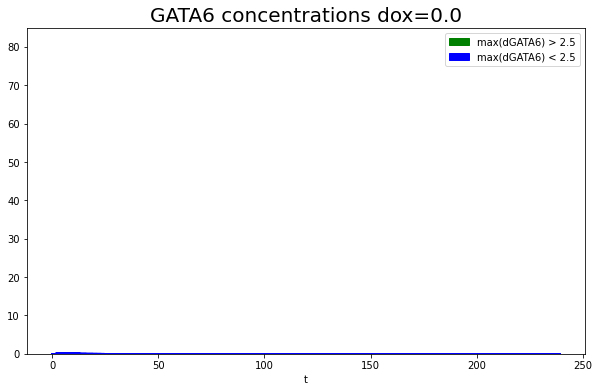

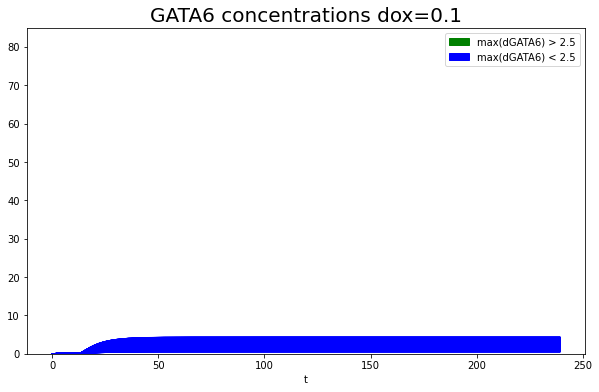

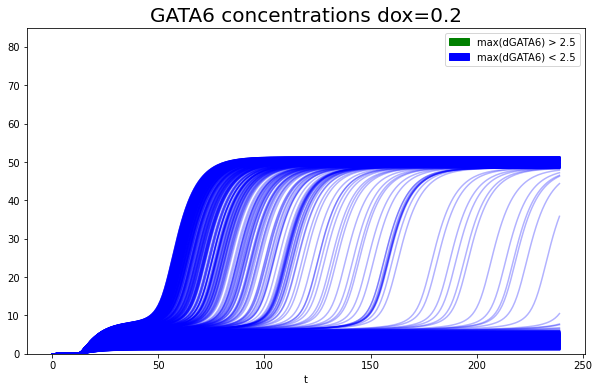

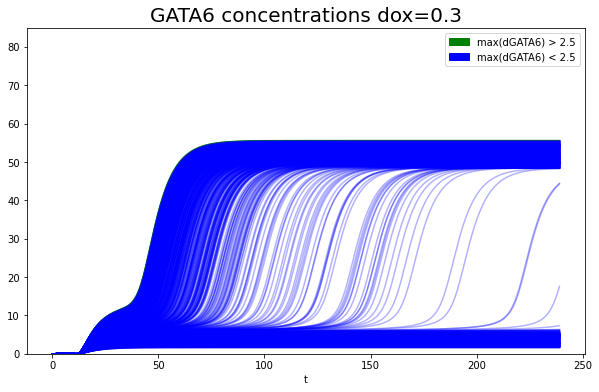

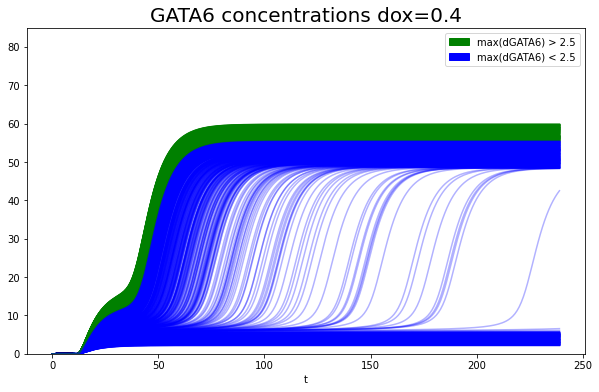

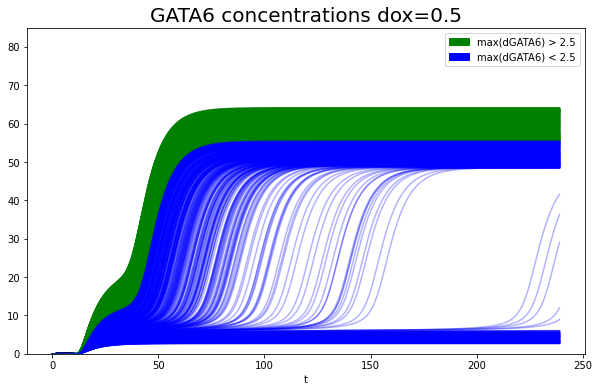

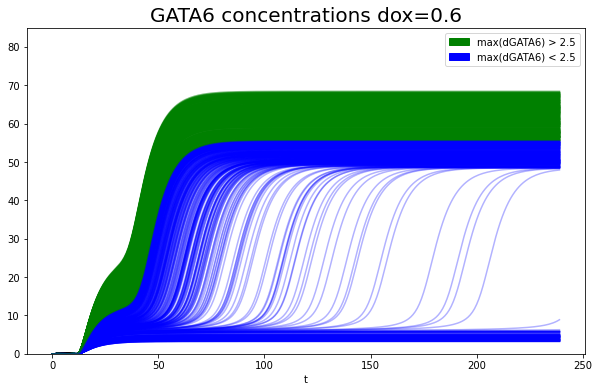

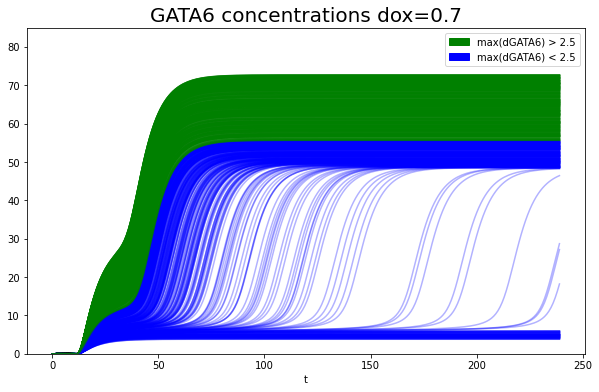

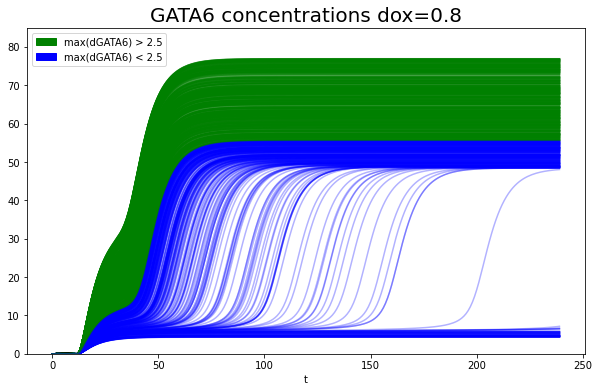

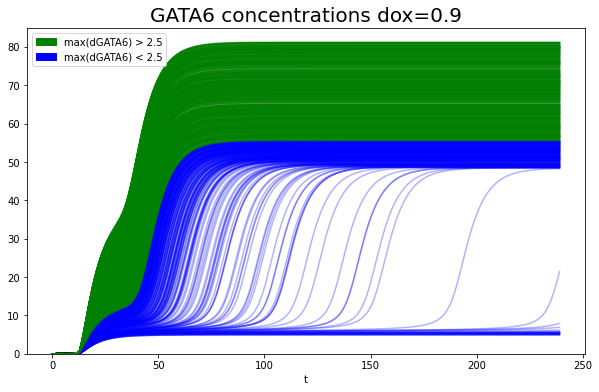

In [8]:
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt

blue = mpatches.Patch(color='blue', label='max(dGATA6) < 2.5')
green = mpatches.Patch(color='green', label='max(dGATA6) > 2.5')

dox = np.arange(0, 1, 0.1)
for j in range(len(list_GATA6)):
    GATA6 = list_GATA6[j]
    NANOG = list_NANOG[j]
    gata6_rna = list_gata6_rna[j]
    nanog_rna = list_nanog_rna[j]
    dGATA6_dt = list_dGATA6_dt[j]
    
    fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
    for i in range(num_cells):
        if max(dGATA6_dt[i,:]) > 2.5:
            ax.plot(t, GATA6[i,:], color='g', alpha=0.3)
        else:
            ax.plot(t, GATA6[i,:], color ='blue', alpha=0.3)
    ax.set_title(f'GATA6 concentrations dox={dox[j]:.1f}', fontsize=20)
    ax.set_ylim([0, 85])
    ax.set_xlabel('t')
    ax.legend(handles=[green, blue], handler_map={plt.Line2D: HandlerLine2D(update_func=change_alpha)})
    plt.savefig(f'./ode_figures/gata6_dgata6_separation_dox={dox[j]:.1f}.png')

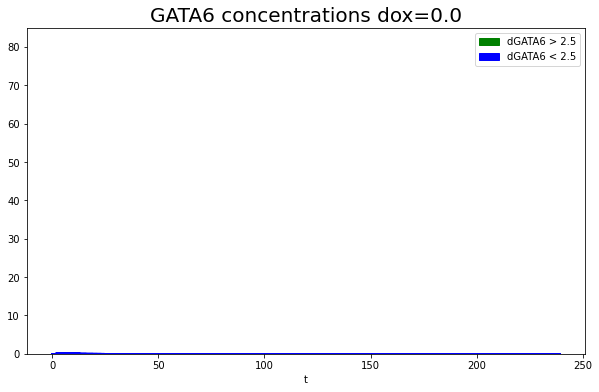

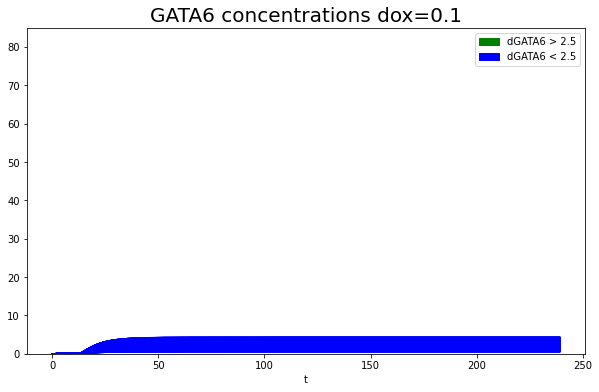

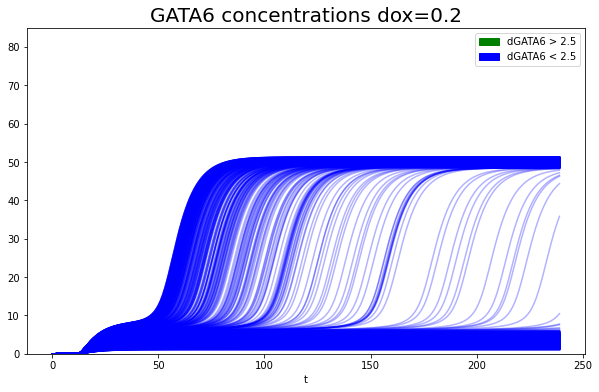

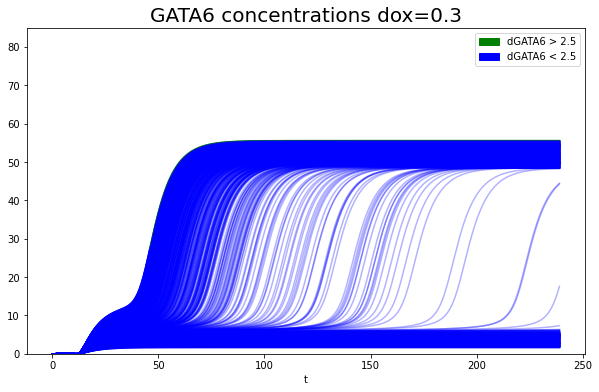

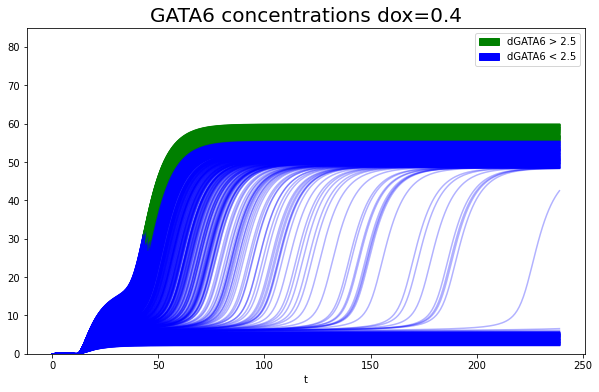

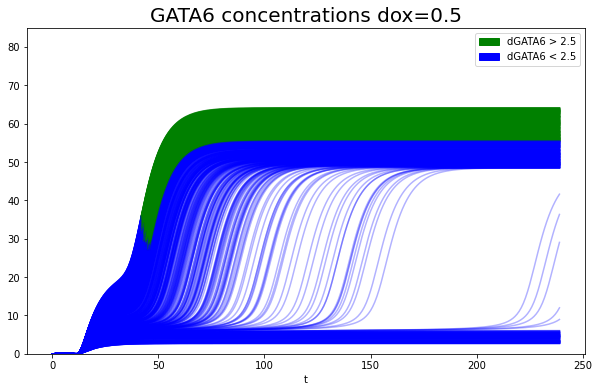

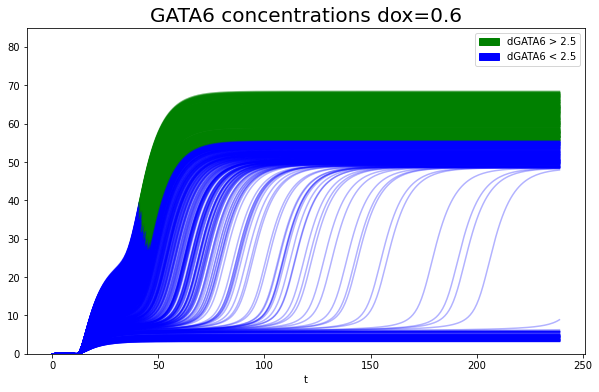

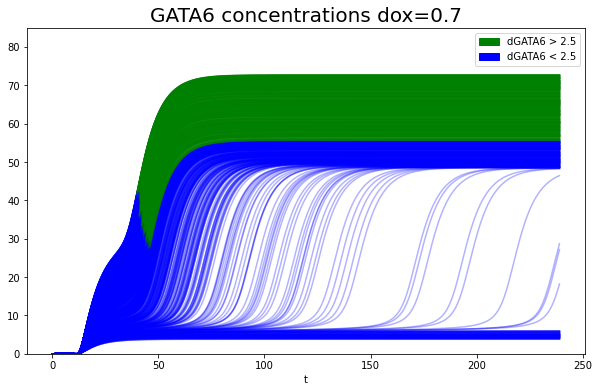

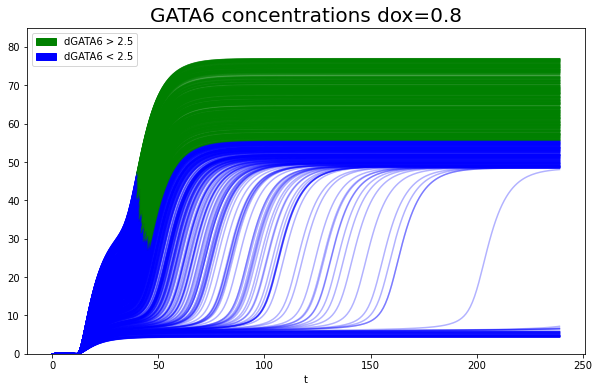

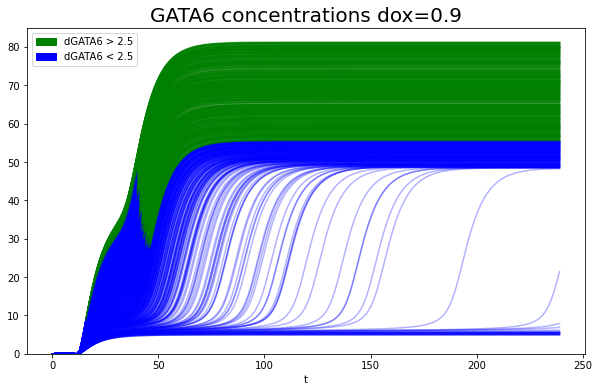

In [9]:
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt

blue = mpatches.Patch(color='blue', label='dGATA6 < 2.5')
green = mpatches.Patch(color='green', label='dGATA6 > 2.5')

dox = np.arange(0, 1, 0.1)
for j in range(len(list_GATA6)):
    GATA6 = list_GATA6[j]
    NANOG = list_NANOG[j]
    gata6_rna = list_gata6_rna[j]
    nanog_rna = list_nanog_rna[j]
    dGATA6_dt = list_dGATA6_dt[j]
    
    fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
    for i in range(num_cells):
        if max(dGATA6_dt[i,:]) > 2.5:
            a = np.where(dGATA6_dt[i,:] == max(dGATA6_dt[i,:]))[0][0]
            ax.plot(t[:a+1], GATA6[i,:a+1], color='blue', alpha=0.3)
            ax.plot(t[a:], GATA6[i,a:], color='g', alpha=0.3)
        else:
            ax.plot(t[:], GATA6[i,:], color='blue', alpha=0.3)
    ax.set_title(f'GATA6 concentrations dox={dox[j]:.1f}', fontsize=20)
    ax.set_ylim([0, 85])
    ax.set_xlabel('t')
    ax.legend(handles=[green, blue], handler_map={plt.Line2D: HandlerLine2D(update_func=change_alpha)})
    plt.savefig(f'./ode_figures/gata6_dgata6_separation_when_dox={dox[j]:.1f}.png')

In [7]:
import numpy as np
from scipy import integrate
from matplotlib import pyplot as plt
from matplotlib.legend_handler import HandlerLine2D


'''
NANOG-GATA6-FOXA2-FOXF1 MODEL with separated protein and rna
We observe few differences in dgata6 due to the dominating hill-like equation in the system
'''

def change_alpha(handle, original):
    ''' Change the alpha and marker style of the legend handles '''
    handle.update_from(original)
    handle.set_alpha(1)
    handle.set_marker('.')

def dnanog_rna(nanog, NANOG, GATA6, a1, a2, a3, n, m, KM_NN, KM_GN):
    return (a1 * NANOG ** n)/(KM_NN ** n + NANOG ** n) * (a2 * KM_GN ** m)/(KM_GN ** m + GATA6 ** m) - a3 * nanog

def dgata6_rna(gata6, NANOG, GATA6, dox, p, a1, a2, a3, n, m, KM_GG, KM_NG):
    return dox * p + (a1 * GATA6 ** n)/(KM_GG ** n + GATA6 ** n) * (a2 * KM_NG ** m)/(KM_NG ** m + NANOG ** m) - a3 * gata6

def dfoxa2_rna(foxa2, dGATA6_conc, FOXA2, FOXF1, a0, a1, a2, a3, n, m, p, KM_22, KM_12, KM_G2):
    return (a0 * dGATA6_conc ** p)/(KM_G2 ** p + dGATA6_conc ** p) + (a1 * FOXA2 ** n)/(KM_22 ** n + FOXA2 ** n) * (a2 * KM_12 ** m)/(KM_12 ** m + FOXF1 ** m) - a3 * foxa2

def dfoxf1_rna(foxf1, dGATA6_conc, FOXA2, FOXF1, a0, a1, a2, a3, n, m, p, KM_11, KM_21, KM_G1):
    return (a0 * dGATA6_conc ** p)/(KM_G1 ** p + dGATA6_conc ** p) + (a1 * FOXF1 ** n)/(KM_11 ** n + FOXF1 ** n) * (a2 * KM_21 ** m)/(KM_21 ** m + FOXA2 ** m) - a3 * foxf1

def dNANOG(NANOG, nanog, a1, a2):
    return a1 * nanog - a2 * NANOG

def dGATA6(GATA6, gata6, a1, a2):
    return a1 * gata6 - a2 * GATA6

def dFOXA2(FOXA2, foxa2, a1, a2):
    return a1 * foxa2 - a2 * FOXA2

def dFOXF1(FOXF1, foxf1, a1, a2):
    return a1 * foxf1 - a2 * FOXF1

def dudt(U, t, dox, p):
    nanog, gata6, foxa2, foxf1, NANOG, GATA6, FOXA2, FOXF1 = U
    a0 = 10
    b0 = 4
    a1 = 4
    b1 = 4
    a2 = 4
    b2 = 4
    a3 = 0.5
    b3 = 0.5
    KM_NN, KM_GN, KM_GG, KM_NG, KM_11, KM_22, KM_12, KM_21 = [5, 5, 5, 5, 5, 5, 5, 5]
    KM_G1, KM_G2 = [1.15, 1.6]
    n = m = 4
    q = 8

    protein_degradation_rate = 0.125
    translation_rate = 0.167

    d = 0
    if t > 12:
        d = dox
    dnanog_dt = dnanog_rna(nanog, NANOG, GATA6, a1, a2, a3, n, m, KM_NN, KM_GN)
    dgata6_dt = dgata6_rna(gata6, NANOG, GATA6, d, p, b1, b2, b3, n, m, KM_GG, KM_NG)
    dGATA6_dt = dGATA6(GATA6, gata6, translation_rate, protein_degradation_rate)
    dNANOG_dt = dNANOG(NANOG, nanog, translation_rate, protein_degradation_rate)
    dfoxa2_dt = dfoxa2_rna(foxa2, dGATA6_dt, FOXA2, FOXF1, a0, a1, a2, a3, n, m, q, KM_22, KM_12, KM_G2)
    dfoxf1_dt = dfoxf1_rna(foxf1, dGATA6_dt, FOXA2, FOXF1, b0, b1, b2, b3, n, m, q, KM_11, KM_21, KM_G1)
    dFOXA2_dt = dFOXA2(FOXA2, foxa2, translation_rate, protein_degradation_rate)
    dFOXF1_dt = dFOXF1(FOXF1, foxf1, translation_rate, protein_degradation_rate)
    return dnanog_dt, dgata6_dt, dfoxa2_dt, dfoxf1_dt, dNANOG_dt, dGATA6_dt, dFOXA2_dt, dFOXF1_dt


dox = np.arange(0, 1, 0.1)
list_FOXF1 = []
list_FOXA2 = []
list_foxf1_rna = []
list_foxa2_rna = []
list_GATA6 = []
list_gata6_rna = []
list_NANOG = []
list_nanog_rna = []
list_dGATA6_dt = []

#dox = [0]
tf = 240
for value in dox:
    num_cells = 1000
    t = np.arange(0, tf, 1)
    

    FOXF1 = np.zeros((num_cells, len(t)))
    foxf1_rna = np.zeros((num_cells, len(t)))
    FOXA2 = np.zeros((num_cells, len(t)))
    foxa2_rna = np.zeros((num_cells, len(t)))
    GATA6 = np.zeros((num_cells, len(t)))
    gata6_rna = np.zeros((num_cells, len(t)))
    nanog_rna = np.zeros((num_cells, len(t)))
    NANOG = np.zeros((num_cells, len(t)))
    
    
    dGATA6_dt = np.zeros((num_cells, len(t)))
    for i in range(num_cells):
        p = np.random.uniform(2, 16)
        nanog_initial = np.random.normal(32)
        gata6_initial = np.random.rand() * 0.15
        NANOG_initial = 43
        GATA6_initial = 0
        foxf1_initial = 0
        foxa2_initial = 0
        FOXA2_initial = 0
        FOXF1_initial = 0
        U = [nanog_initial, gata6_initial, foxa2_initial, foxf1_initial, NANOG_initial, GATA6_initial, FOXA2_initial, FOXF1_initial]
        values = integrate.odeint(dudt, U, t, args=(value, p))
        foxa2_rna[i,:], foxf1_rna[i,:], FOXA2[i,:], FOXF1[i,:] = values[:,2], values[:,3], values[:,6], values[:,7]
        nanog_rna[i,:], gata6_rna[i,:], NANOG[i,:], GATA6[i,:] = values[:,0], values[:,1], values[:,4], values[:,5]
    list_GATA6.append(GATA6)
    list_gata6_rna.append(gata6_rna)
    list_NANOG.append(NANOG)
    list_nanog_rna.append(nanog_rna)
    list_dGATA6_dt.append(dGATA6_dt)
    list_FOXF1.append(FOXF1)
    list_FOXA2.append(FOXA2)
    list_foxf1_rna.append(foxf1_rna)
    list_foxa2_rna.append(foxa2_rna)

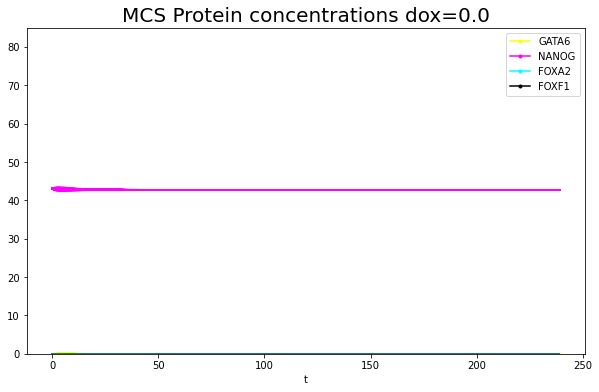

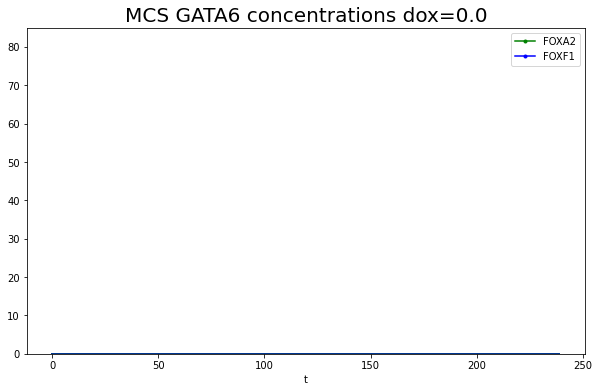

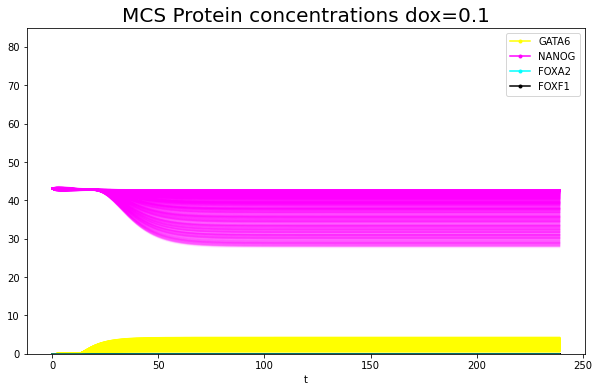

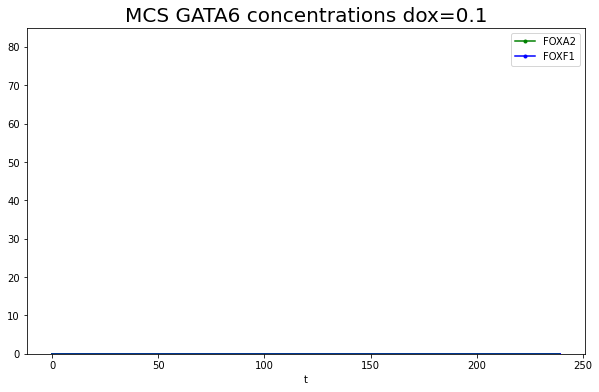

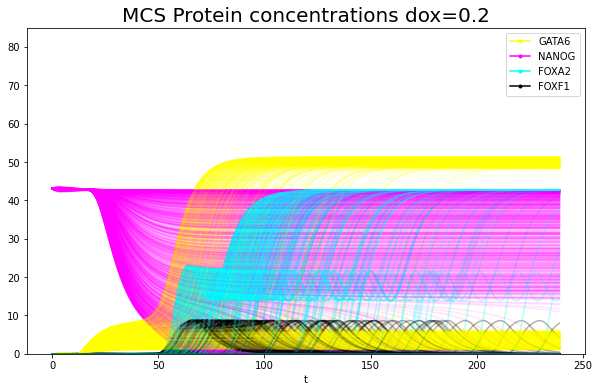

...

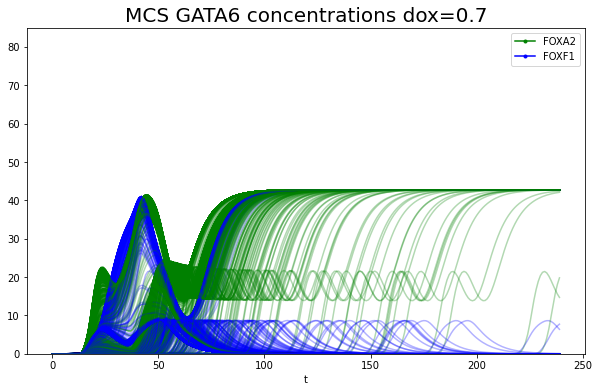

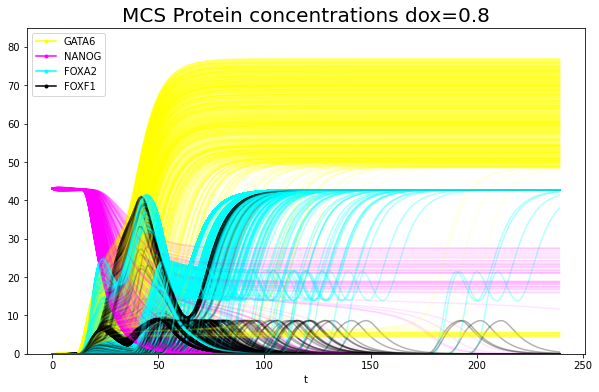

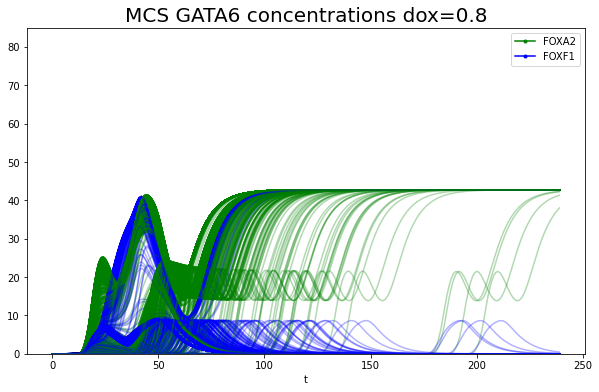

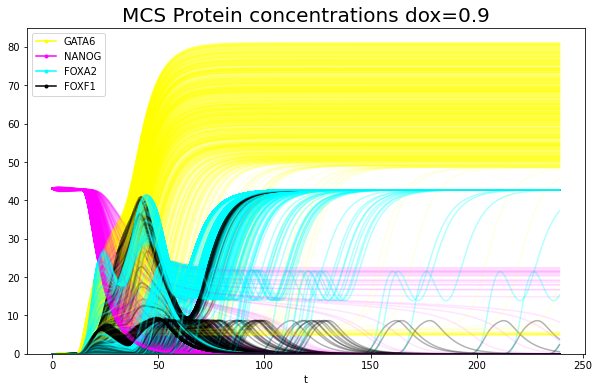

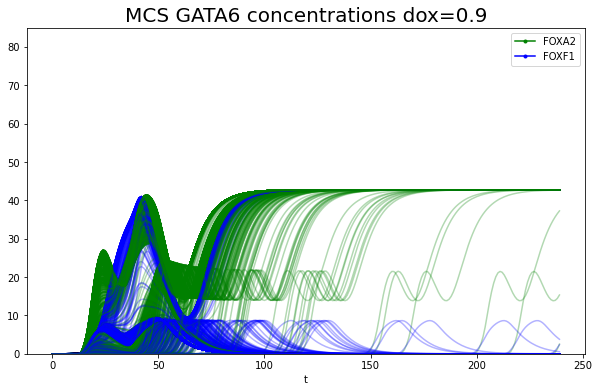

In [8]:
dox = np.arange(0, 1, 0.1)
for j in range(len(list_GATA6)):
    GATA6 = list_GATA6[j]
    NANOG = list_NANOG[j]
    FOXA2 = list_FOXA2[j]
    FOXF1 = list_FOXF1[j]
    foxa2_rna = list_foxa2_rna[j]
    foxf1_rna = list_foxf1_rna[j]
    fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
    for i in range(num_cells):
        ax.plot(t, GATA6[i,:], color='yellow', alpha=0.1)
        ax.plot(t, NANOG[i,:], color ='magenta', alpha=0.1)
        ax.plot(t, FOXA2[i,:], color='cyan', alpha=0.3)
        ax.plot(t, FOXF1[i,:], color='black', alpha=0.3)
    ax.set_title(f'MCS Protein concentrations dox={dox[j]:.1f}', fontsize=20)
    ax.set_ylim([0, 85])
    ax.set_xlabel('t')
    plt.legend(['GATA6', 'NANOG', 'FOXA2', 'FOXF1'], handler_map={plt.Line2D: HandlerLine2D(update_func=change_alpha)})
    

    
    fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
    for i in range(num_cells):
        ax.plot(t, FOXA2[i,:], color='g', alpha=0.3)
        ax.plot(t, FOXF1[i,:], color ='blue', alpha=0.3)
    ax.set_title(f'MCS GATA6 concentrations dox={dox[j]:.1f}', fontsize=20)
    ax.set_ylim([0, 85])
    ax.set_xlabel('t')
    plt.legend(['FOXA2', 'FOXF1'], handler_map={plt.Line2D: HandlerLine2D(update_func=change_alpha)})

In [10]:
import numpy as np
from scipy import integrate
from matplotlib import pyplot as plt
from matplotlib.legend_handler import HandlerLine2D


'''
NANOG-GATA6-FOXA2-FOXF1 MODEL with separated protein and rna
Model A V1
In this system, FOXF1 is activated at at low GATA6 and inhibited at high GATA6,
FOXA2 is activated by GATA6
We observe few differences in dgata6 due to the dominating hill-like equation in the system
'''

def change_alpha(handle, original):
    ''' Change the alpha and marker style of the legend handles '''
    handle.update_from(original)
    handle.set_alpha(1)
    handle.set_marker('.')

def dnanog_rna(nanog, NANOG, GATA6, a1, a2, a3, n, m, KM_NN, KM_GN):
    return (a1 * NANOG ** n)/(KM_NN ** n + NANOG ** n) * (a2 * KM_GN ** m)/(KM_GN ** m + GATA6 ** m) - a3 * nanog

def dgata6_rna(gata6, NANOG, GATA6, dox, p, a1, a2, a3, n, m, KM_GG, KM_NG):
    return dox * p + (a1 * GATA6 ** n)/(KM_GG ** n + GATA6 ** n) * (a2 * KM_NG ** m)/(KM_NG ** m + NANOG ** m) - a3 * gata6

def dfoxa2_rna(foxa2, GATA6, FOXF1, a0, a1, a2, n, m, KM_12, KM_G2):
    return (a0 * GATA6 ** n)/(KM_G2 ** n + GATA6 ** n) * (a1 * KM_12 ** m)/(KM_12 ** m + FOXF1 ** m) - a2 * foxa2

def dfoxf1_rna(foxf1, GATA6, FOXA2, a0, a1, a2, n, m, KM_21, KM_G1):
    return a0 * GATA6 * (1 - ((GATA6 ** n)/(KM_G1 ** n + GATA6 ** n))) * (a1 * KM_21 ** m)/(KM_21 ** m + FOXA2 ** m) - a2 * foxf1

def dNANOG(NANOG, nanog, a1, a2):
    return a1 * nanog - a2 * NANOG

def dGATA6(GATA6, gata6, a1, a2):
    return a1 * gata6 - a2 * GATA6

def dFOXA2(FOXA2, foxa2, a1, a2):
    return a1 * foxa2 - a2 * FOXA2

def dFOXF1(FOXF1, foxf1, a1, a2):
    return a1 * foxf1 - a2 * FOXF1

def dudt(U, t, dox, p):
    nanog, gata6, foxa2, foxf1, NANOG, GATA6, FOXA2, FOXF1 = U
    a0 = 3
    b0 = 0.1
    a1 = 4
    b1 = 4
    a2 = 4
    b2 = 4
    a3 = 0.5
    b3 = 0.5
    KM_NN, KM_GN, KM_GG, KM_NG, KM_11, KM_22, KM_12, KM_21 = [5, 5, 5, 5, 5, 5, 5, 5]
    KM_G1, KM_G2 = [55, 55]
    n = m = 4
    gata6_n = 8
    fox_n = 2

    protein_degradation_rate = 0.125
    translation_rate = 0.167

    d = 0
    if t > 12:
        d = dox
    dnanog_dt = dnanog_rna(nanog, NANOG, GATA6, a1, a2, a3, n, m, KM_NN, KM_GN)
    dgata6_dt = dgata6_rna(gata6, NANOG, GATA6, d, p, b1, b2, b3, n, m, KM_GG, KM_NG)
    dGATA6_dt = dGATA6(GATA6, gata6, translation_rate, protein_degradation_rate)
    dNANOG_dt = dNANOG(NANOG, nanog, translation_rate, protein_degradation_rate)
    dfoxa2_dt = dfoxa2_rna(foxa2, GATA6, FOXF1, a0, a1, a3, gata6_n, fox_n, KM_12, KM_G2)
    dfoxf1_dt = dfoxf1_rna(foxf1, GATA6, FOXA2, b0, b1, b3, gata6_n, fox_n, KM_21, KM_G1)
    dFOXA2_dt = dFOXA2(FOXA2, foxa2, translation_rate, protein_degradation_rate)
    dFOXF1_dt = dFOXF1(FOXF1, foxf1, translation_rate, protein_degradation_rate)
    return dnanog_dt, dgata6_dt, dfoxa2_dt, dfoxf1_dt, dNANOG_dt, dGATA6_dt, dFOXA2_dt, dFOXF1_dt


dox = np.arange(0, 1, 0.1)
list_FOXF1 = []
list_FOXA2 = []
list_foxf1_rna = []
list_foxa2_rna = []
list_GATA6 = []
list_gata6_rna = []
list_NANOG = []
list_nanog_rna = []
list_dGATA6_dt = []

#dox = [0]
tf = 240
num_cells = 1000
for value in dox:
    t = np.arange(0, tf, 1)
    

    FOXF1 = np.zeros((num_cells, len(t)))
    foxf1_rna = np.zeros((num_cells, len(t)))
    FOXA2 = np.zeros((num_cells, len(t)))
    foxa2_rna = np.zeros((num_cells, len(t)))
    
    GATA6 = np.zeros((num_cells, len(t)))
    gata6_rna = np.zeros((num_cells, len(t)))
    nanog_rna = np.zeros((num_cells, len(t)))
    NANOG = np.zeros((num_cells, len(t)))
    
    
    dGATA6_dt = np.zeros((num_cells, len(t)))
    for i in range(num_cells):
        p = np.random.uniform(2, 16)
        nanog_initial = np.random.normal(32)
        gata6_initial = np.random.rand() * 0.15
        NANOG_initial = 43
        GATA6_initial = 0
        foxf1_initial = 0
        foxa2_initial = 0
        FOXA2_initial = 0
        FOXF1_initial = 0
        U = [nanog_initial, gata6_initial, foxa2_initial, foxf1_initial, NANOG_initial, GATA6_initial, FOXA2_initial, FOXF1_initial]
        values = integrate.odeint(dudt, U, t, args=(value, p))
        foxa2_rna[i,:], foxf1_rna[i,:], FOXA2[i,:], FOXF1[i,:] = values[:,2], values[:,3], values[:,6], values[:,7]
        nanog_rna[i,:], gata6_rna[i,:], NANOG[i,:], GATA6[i,:] = values[:,0], values[:,1], values[:,4], values[:,5]
    list_GATA6.append(GATA6)
    list_gata6_rna.append(gata6_rna)
    list_NANOG.append(NANOG)
    list_nanog_rna.append(nanog_rna)
    list_dGATA6_dt.append(dGATA6_dt)
    list_FOXF1.append(FOXF1)
    list_FOXA2.append(FOXA2)
    list_foxf1_rna.append(foxf1_rna)
    list_foxa2_rna.append(foxa2_rna)

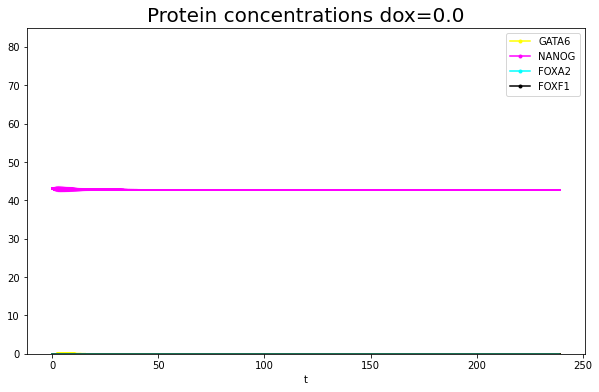

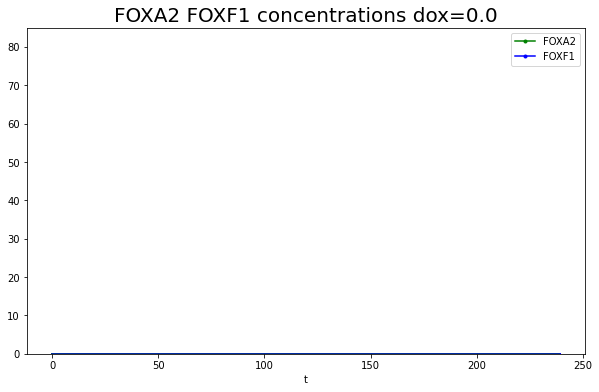

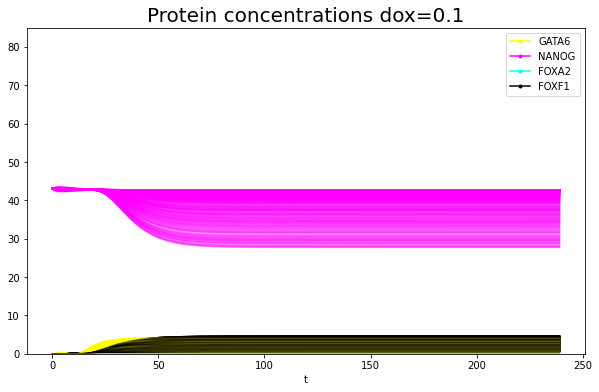

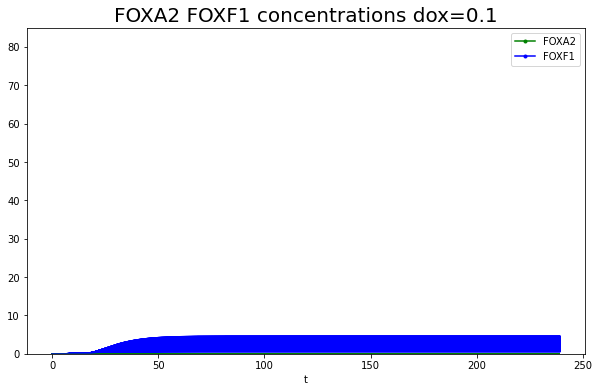

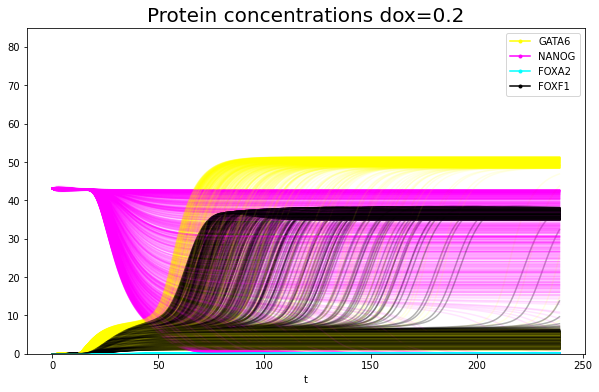

...

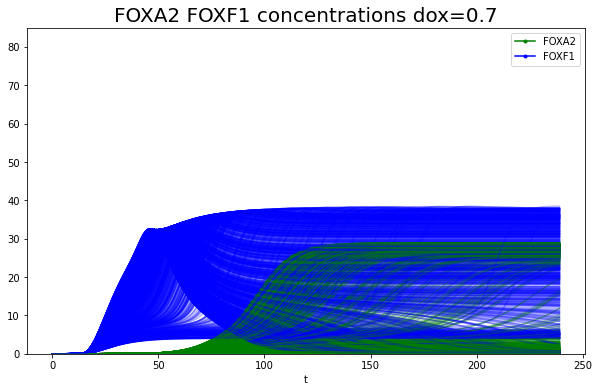

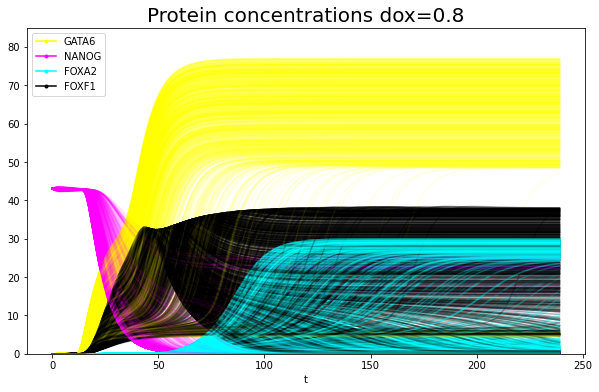

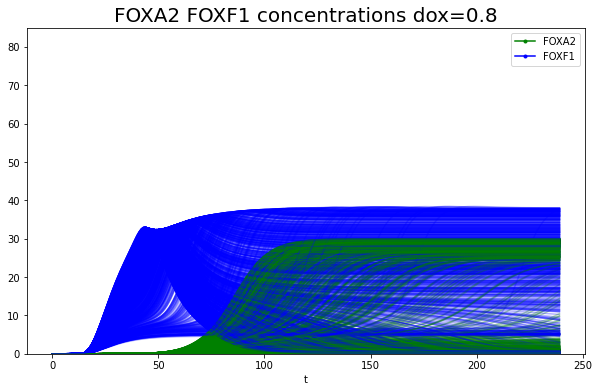

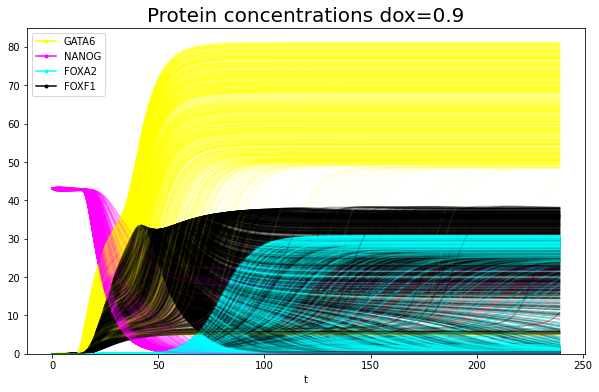

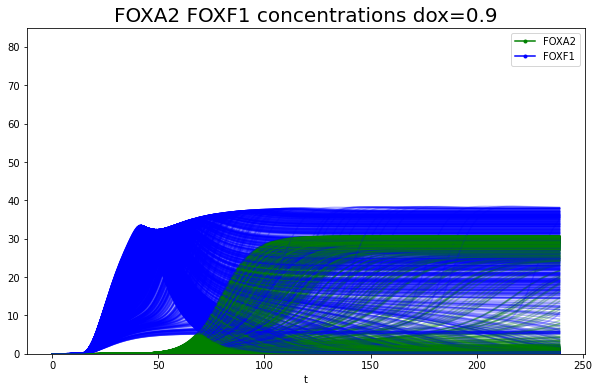

In [11]:
dox = np.arange(0, 1, 0.1)
for j in range(len(list_GATA6)):
    GATA6 = list_GATA6[j]
    NANOG = list_NANOG[j]
    FOXA2 = list_FOXA2[j]
    FOXF1 = list_FOXF1[j]
    foxa2_rna = list_foxa2_rna[j]
    foxf1_rna = list_foxf1_rna[j]
    fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
    for i in range(num_cells):
        ax.plot(t, GATA6[i,:], color='yellow', alpha=0.1)
        ax.plot(t, NANOG[i,:], color ='magenta', alpha=0.1)
        ax.plot(t, FOXA2[i,:], color='cyan', alpha=0.3)
        ax.plot(t, FOXF1[i,:], color='black', alpha=0.3)
    ax.set_title(f'Protein concentrations dox={dox[j]:.1f}', fontsize=20)
    ax.set_ylim([0, 85])
    ax.set_xlabel('t')
    plt.legend(['GATA6', 'NANOG', 'FOXA2', 'FOXF1'], handler_map={plt.Line2D: HandlerLine2D(update_func=change_alpha)})
    plt.savefig(f'./ode_figures/all_proteins_MesoEndo_RD1_dox={dox[j]:.1f}.png')    

    
    fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
    for i in range(num_cells):
        ax.plot(t, FOXA2[i,:], color='g', alpha=0.3)
        ax.plot(t, FOXF1[i,:], color ='blue', alpha=0.3)
    ax.set_title(f'FOXA2 FOXF1 concentrations dox={dox[j]:.1f}', fontsize=20)
    ax.set_ylim([0, 85])
    ax.set_xlabel('t')
    plt.legend(['FOXA2', 'FOXF1'], handler_map={plt.Line2D: HandlerLine2D(update_func=change_alpha)})
    plt.savefig(f'./ode_figures/FOXA2_FOXF1_MesoEndo_RD1_dox={dox[j]:.1f}.png')    


Text(0.5, 1.0, 'Steady State FOXF1 Values')

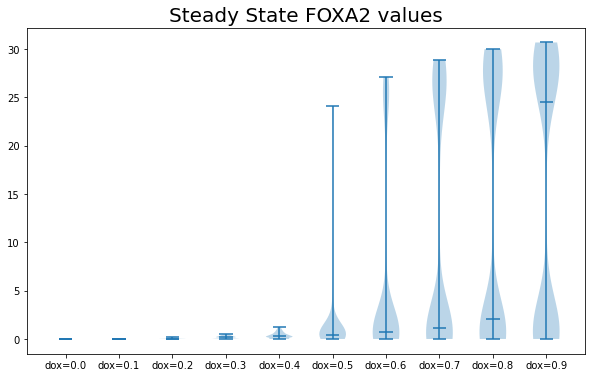

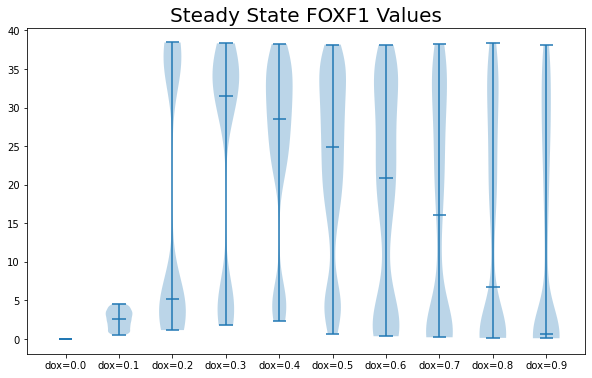

In [39]:
def write_legend(dox_values):
    a = []
    for i in dox_values:
        a.append(f'dox={i:.1f}')
    return a
dox = np.arange(0, 1, 0.1)
fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
#kwargs = dict(lw=0, alpha=0.5, bins=50, histtype='bar', stacked=True, range=[2,3])
ss_foxa2 = []
for FOXA2 in list_FOXA2:
    ss_foxa2.append(FOXA2[:,-1])
ax.violinplot(ss_foxa2, showmeans=False,showmedians=True)
plt.xticks([y + 1 for y in range(len(max_dt))], labels=write_legend(dox))
ax.set_title(f'Steady State FOXA2 values', fontsize=20)


fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
#kwargs = dict(lw=0, alpha=0.5, bins=50, histtype='bar', stacked=True, range=[2,3])
ss_foxf1 = []
for FOXF1 in list_FOXF1:
    ss_foxf1.append(FOXF1[:,-1])

ax.violinplot(ss_foxf1, showmeans=False,showmedians=True)
plt.xticks([y + 1 for y in range(len(ss_gata))], labels=write_legend(dox))
ax.set_title(f'Steady State FOXF1 Values', fontsize=20)

In [51]:
import numpy as np
from scipy import integrate
from matplotlib import pyplot as plt
from matplotlib.legend_handler import HandlerLine2D


'''
NANOG-GATA6-FOXA2-FOXF1 MODEL with separated protein and rna
Model B V1
In this system, FOXF1 is activated at at low GATA6 and inhibited at high GATA6 via a noncompetitive inhibition function,
FOXA2 is activated by GATA6
We observe few differences in dgata6 due to the dominating hill-like equation in the system
'''

def change_alpha(handle, original):
    ''' Change the alpha and marker style of the legend handles '''
    handle.update_from(original)
    handle.set_alpha(1)
    handle.set_marker('.')

def dnanog_rna(nanog, NANOG, GATA6, a1, a2, a3, n, m, KM_NN, KM_GN):
    return (a1 * NANOG ** n)/(KM_NN ** n + NANOG ** n) * (a2 * KM_GN ** m)/(KM_GN ** m + GATA6 ** m) - a3 * nanog

def dgata6_rna(gata6, NANOG, GATA6, dox, p, a1, a2, a3, n, m, KM_GG, KM_NG):
    return dox * p + (a1 * GATA6 ** n)/(KM_GG ** n + GATA6 ** n) * (a2 * KM_NG ** m)/(KM_NG ** m + NANOG ** m) - a3 * gata6

def dfoxa2_rna(foxa2, GATA6, FOXF1, a0, a1, a2, n, m, KM_12, KM_G2):
    return (a0 * GATA6 ** n)/(KM_G2 ** n + GATA6 ** n) * (a1 * KM_12 ** m)/(KM_12 ** m + FOXF1 ** m) - a2 * foxa2

def dfoxf1_rna(foxf1, GATA6, FOXA2, a0, a1, a2, n, m, KM_21, KM_G1, KM_GI):
    return (a0 * GATA6 ** n)/(KM_G1 ** n + GATA6 ** n) * (a1 * KM_21 ** m)/(KM_21 ** m + FOXA2 ** m) / (1+(GATA6/KM_GI) ** n) - a2 * foxf1

def dNANOG(NANOG, nanog, a1, a2):
    return a1 * nanog - a2 * NANOG

def dGATA6(GATA6, gata6, a1, a2):
    return a1 * gata6 - a2 * GATA6

def dFOXA2(FOXA2, foxa2, a1, a2):
    return a1 * foxa2 - a2 * FOXA2

def dFOXF1(FOXF1, foxf1, a1, a2):
    return a1 * foxf1 - a2 * FOXF1

def dudt(U, t, dox, p):
    nanog, gata6, foxa2, foxf1, NANOG, GATA6, FOXA2, FOXF1 = U
    a0 = 3
    b0 = 3
    a1 = 4
    b1 = 4
    a2 = 4
    b2 = 4
    a3 = 0.5
    b3 = 0.5
    KM_NN, KM_GN, KM_GG, KM_NG, KM_11, KM_22, KM_12, KM_21 = [5, 5, 5, 5, 5, 5, 5, 5]
    KM_G1, KM_G2, KM_GI = [55, 55, 70]
    n = m = 4
    gata6_n = 8
    fox_n = 2

    protein_degradation_rate = 0.125
    translation_rate = 0.167

    d = 0
    if t > 12:
        d = dox
    dnanog_dt = dnanog_rna(nanog, NANOG, GATA6, a1, a2, a3, n, m, KM_NN, KM_GN)
    dgata6_dt = dgata6_rna(gata6, NANOG, GATA6, d, p, b1, b2, b3, n, m, KM_GG, KM_NG)
    dGATA6_dt = dGATA6(GATA6, gata6, translation_rate, protein_degradation_rate)
    dNANOG_dt = dNANOG(NANOG, nanog, translation_rate, protein_degradation_rate)
    dfoxa2_dt = dfoxa2_rna(foxa2, GATA6, FOXF1, a0, a1, a3, gata6_n, fox_n, KM_12, KM_G2)
    dfoxf1_dt = dfoxf1_rna(foxf1, GATA6, FOXA2, b0, b1, b3, gata6_n, fox_n, KM_21, KM_G1, KM_GI)
    dFOXA2_dt = dFOXA2(FOXA2, foxa2, translation_rate, protein_degradation_rate)
    dFOXF1_dt = dFOXF1(FOXF1, foxf1, translation_rate, protein_degradation_rate)
    return dnanog_dt, dgata6_dt, dfoxa2_dt, dfoxf1_dt, dNANOG_dt, dGATA6_dt, dFOXA2_dt, dFOXF1_dt


dox = np.arange(0, 1, 0.1)
list_FOXF1 = []
list_FOXA2 = []
list_foxf1_rna = []
list_foxa2_rna = []
list_GATA6 = []
list_gata6_rna = []
list_NANOG = []
list_nanog_rna = []
list_dGATA6_dt = []

#dox = [0]
tf = 240
num_cells = 1000
for value in dox:
    t = np.arange(0, tf, 1)
    

    FOXF1 = np.zeros((num_cells, len(t)))
    foxf1_rna = np.zeros((num_cells, len(t)))
    FOXA2 = np.zeros((num_cells, len(t)))
    foxa2_rna = np.zeros((num_cells, len(t)))
    
    GATA6 = np.zeros((num_cells, len(t)))
    gata6_rna = np.zeros((num_cells, len(t)))
    nanog_rna = np.zeros((num_cells, len(t)))
    NANOG = np.zeros((num_cells, len(t)))
    
    
    dGATA6_dt = np.zeros((num_cells, len(t)))
    for i in range(num_cells):
        p = np.random.uniform(2, 16)
        nanog_initial = np.random.normal(32)
        gata6_initial = np.random.rand() * 0.15
        NANOG_initial = 43
        GATA6_initial = 0
        foxf1_initial = 0
        foxa2_initial = 0
        FOXA2_initial = 0
        FOXF1_initial = 0
        U = [nanog_initial, gata6_initial, foxa2_initial, foxf1_initial, NANOG_initial, GATA6_initial, FOXA2_initial, FOXF1_initial]
        values = integrate.odeint(dudt, U, t, args=(value, p))
        foxa2_rna[i,:], foxf1_rna[i,:], FOXA2[i,:], FOXF1[i,:] = values[:,2], values[:,3], values[:,6], values[:,7]
        nanog_rna[i,:], gata6_rna[i,:], NANOG[i,:], GATA6[i,:] = values[:,0], values[:,1], values[:,4], values[:,5]
    list_GATA6.append(GATA6)
    list_gata6_rna.append(gata6_rna)
    list_NANOG.append(NANOG)
    list_nanog_rna.append(nanog_rna)
    list_dGATA6_dt.append(dGATA6_dt)
    list_FOXF1.append(FOXF1)
    list_FOXA2.append(FOXA2)
    list_foxf1_rna.append(foxf1_rna)
    list_foxa2_rna.append(foxa2_rna)

Text(0.5, 1.0, 'Steady State FOXF1 Values')

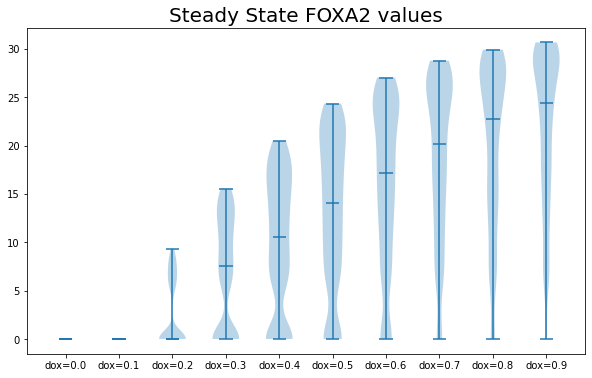

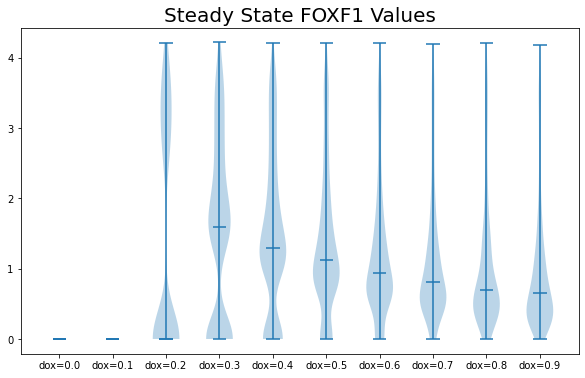

In [52]:
def write_legend(dox_values):
    a = []
    for i in dox_values:
        a.append(f'dox={i:.1f}')
    return a
dox = np.arange(0, 1, 0.1)
fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
#kwargs = dict(lw=0, alpha=0.5, bins=50, histtype='bar', stacked=True, range=[2,3])
ss_foxa2 = []
for FOXA2 in list_FOXA2:
    ss_foxa2.append(FOXA2[:,-1])
ax.violinplot(ss_foxa2, showmeans=False,showmedians=True)
plt.xticks([y + 1 for y in range(len(max_dt))], labels=write_legend(dox))
ax.set_title(f'Steady State FOXA2 values', fontsize=20)


fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
#kwargs = dict(lw=0, alpha=0.5, bins=50, histtype='bar', stacked=True, range=[2,3])
ss_foxf1 = []
for FOXF1 in list_FOXF1:
    ss_foxf1.append(FOXF1[:,-1])

ax.violinplot(ss_foxf1, showmeans=False,showmedians=True)
plt.xticks([y + 1 for y in range(len(ss_gata))], labels=write_legend(dox))
ax.set_title(f'Steady State FOXF1 Values', fontsize=20)

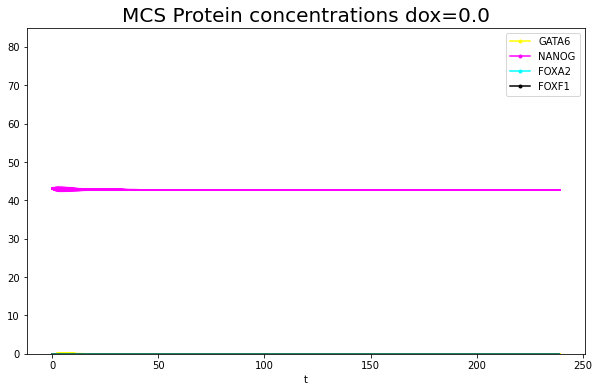

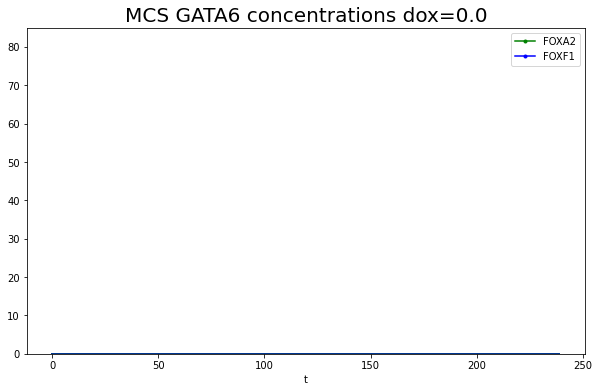

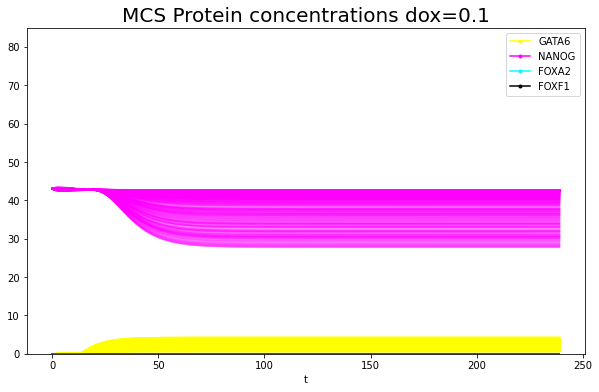

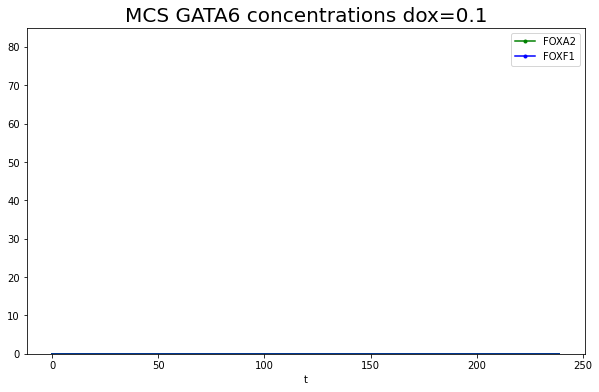

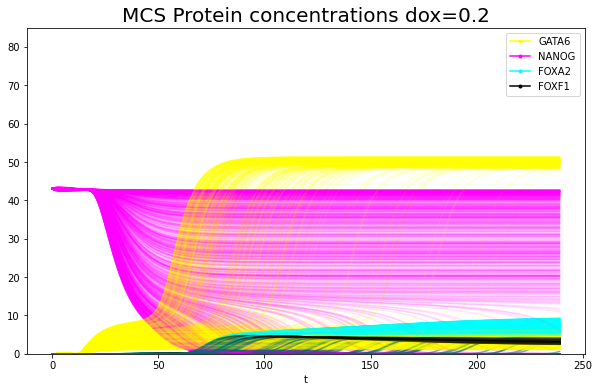

...

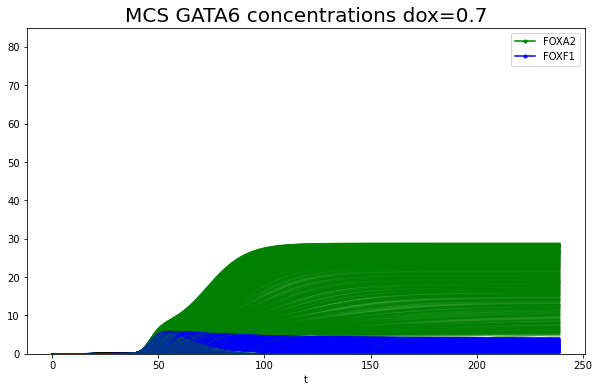

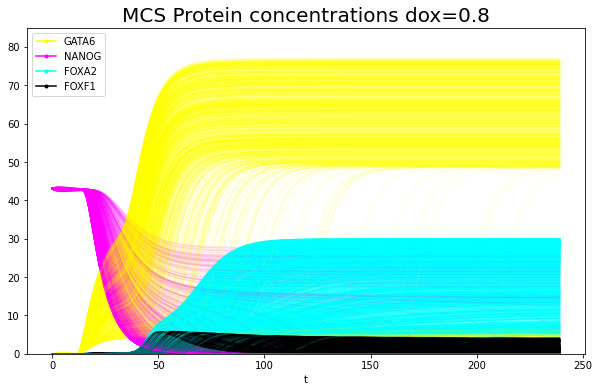

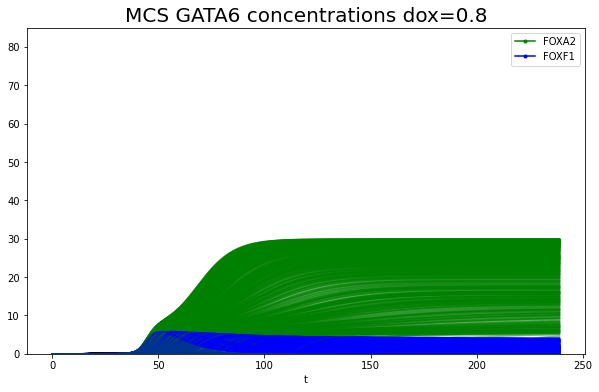

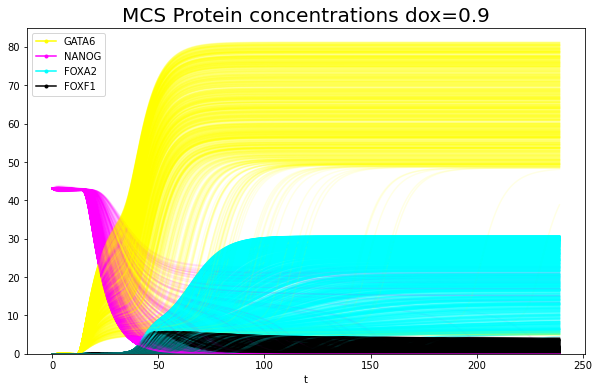

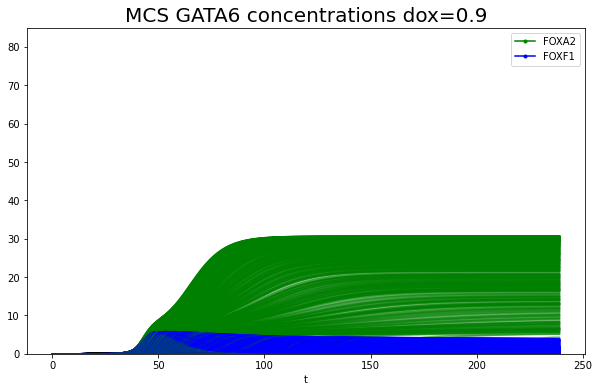

In [53]:
dox = np.arange(0, 1, 0.1)
for j in range(len(list_GATA6)):
    GATA6 = list_GATA6[j]
    NANOG = list_NANOG[j]
    FOXA2 = list_FOXA2[j]
    FOXF1 = list_FOXF1[j]
    foxa2_rna = list_foxa2_rna[j]
    foxf1_rna = list_foxf1_rna[j]
    fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
    for i in range(num_cells):
        ax.plot(t, GATA6[i,:], color='yellow', alpha=0.1)
        ax.plot(t, NANOG[i,:], color ='magenta', alpha=0.1)
        ax.plot(t, FOXA2[i,:], color='cyan', alpha=0.3)
        ax.plot(t, FOXF1[i,:], color='black', alpha=0.3)
    ax.set_title(f'MCS Protein concentrations dox={dox[j]:.1f}', fontsize=20)
    ax.set_ylim([0, 85])
    ax.set_xlabel('t')
    plt.legend(['GATA6', 'NANOG', 'FOXA2', 'FOXF1'], handler_map={plt.Line2D: HandlerLine2D(update_func=change_alpha)})
    

    
    fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
    for i in range(num_cells):
        ax.plot(t, FOXA2[i,:], color='g', alpha=0.3)
        ax.plot(t, FOXF1[i,:], color ='blue', alpha=0.3)
    ax.set_title(f'MCS GATA6 concentrations dox={dox[j]:.1f}', fontsize=20)
    ax.set_ylim([0, 85])
    ax.set_xlabel('t')
    plt.legend(['FOXA2', 'FOXF1'], handler_map={plt.Line2D: HandlerLine2D(update_func=change_alpha)})

In [19]:
import numpy as np
from scipy import integrate
from matplotlib import pyplot as plt
from matplotlib.legend_handler import HandlerLine2D


'''
NANOG-GATA6-FOXA2-FOXF1 MODEL with separated protein and rna
MODEL A V2
In this system, FOXF1 is activated at at low GATA6 and inhibited at high GATA6,
FOXA2 is activated by GATA6
We observe few differences in dgata6 due to the dominating hill-like equation in the system
'''

def change_alpha(handle, original):
    ''' Change the alpha and marker style of the legend handles '''
    handle.update_from(original)
    handle.set_alpha(1)
    handle.set_marker('.')

def dnanog_rna(nanog, NANOG, GATA6, a1, a2, a3, n, m, KM_NN, KM_GN):
    return (a1 * NANOG ** n)/(KM_NN ** n + NANOG ** n) * (a2 * KM_GN ** m)/(KM_GN ** m + GATA6 ** m) - a3 * nanog

def dgata6_rna(gata6, NANOG, GATA6, dox, p, a1, a2, a3, n, m, KM_GG, KM_NG):
    return dox * p + (a1 * GATA6 ** n)/(KM_GG ** n + GATA6 ** n) * (a2 * KM_NG ** m)/(KM_NG ** m + NANOG ** m) - a3 * gata6

def dfoxa2_rna(foxa2, GATA6, FOXF1, a0, a1, a2, n, m, KM_12, KM_G2):
    return (a0 * GATA6 ** n)/(KM_G2 ** n + GATA6 ** n) * (a1 * KM_12 ** m)/(KM_12 ** m + FOXF1 ** m) - a2 * foxa2

def dfoxf1_rna(foxf1, GATA6, FOXA2, a0, a1, a2, a3, n, m, KM_21, KM_GA, KM_GI):
    return a0 * ((GATA6 ** n)/ (KM_GA ** n + GATA6 ** n) * (KM_GI ** n)/(KM_GI ** n + GATA6 ** n)) * (a2 * KM_21 ** m)/(KM_21 ** m + FOXA2 ** m) - a3 * foxf1

def dNANOG(NANOG, nanog, a1, a2):
    return a1 * nanog - a2 * NANOG

def dGATA6(GATA6, gata6, a1, a2):
    return a1 * gata6 - a2 * GATA6

def dFOXA2(FOXA2, foxa2, a1, a2):
    return a1 * foxa2 - a2 * FOXA2

def dFOXF1(FOXF1, foxf1, a1, a2):
    return a1 * foxf1 - a2 * FOXF1

def dudt(U, t, dox, p):
    nanog, gata6, foxa2, foxf1, NANOG, GATA6, FOXA2, FOXF1 = U
    a0 = 4
    b0 = 4
    a1 = 4
    b1 = 4
    a2 = 4
    b2 = 4
    a3 = 0.5
    b3 = 0.5
    KM_NN, KM_GN, KM_GG, KM_NG, KM_11, KM_22, KM_12, KM_21 = [5, 5, 5, 5, 5, 5, 5, 5]
    KM_G1A, KM_G1I, KM_G2 = [40, 55, 55]
    n = m = 4
    gata6_n = 8
    fox_n = 2

    protein_degradation_rate = 0.125
    translation_rate = 0.167

    d = 0
    if t > 12:
        d = dox
    dnanog_dt = dnanog_rna(nanog, NANOG, GATA6, a1, a2, a3, n, m, KM_NN, KM_GN)
    dgata6_dt = dgata6_rna(gata6, NANOG, GATA6, d, p, b1, b2, b3, n, m, KM_GG, KM_NG)
    dGATA6_dt = dGATA6(GATA6, gata6, translation_rate, protein_degradation_rate)
    dNANOG_dt = dNANOG(NANOG, nanog, translation_rate, protein_degradation_rate)
    dfoxa2_dt = dfoxa2_rna(foxa2, GATA6, FOXF1, a0, a1, a3, gata6_n, fox_n, KM_12, KM_G2)
    dfoxf1_dt = dfoxf1_rna(foxf1, GATA6, FOXA2, b0, b0, b2, b3, gata6_n, fox_n, KM_21, KM_G1A, KM_G1I)
    dFOXA2_dt = dFOXA2(FOXA2, foxa2, translation_rate, protein_degradation_rate)
    dFOXF1_dt = dFOXF1(FOXF1, foxf1, translation_rate, protein_degradation_rate)
    return dnanog_dt, dgata6_dt, dfoxa2_dt, dfoxf1_dt, dNANOG_dt, dGATA6_dt, dFOXA2_dt, dFOXF1_dt


dox = np.arange(0, 1, 0.1)
list_FOXF1 = []
list_FOXA2 = []
list_foxf1_rna = []
list_foxa2_rna = []
list_GATA6 = []
list_gata6_rna = []
list_NANOG = []
list_nanog_rna = []
list_dGATA6_dt = []

#dox = [0]
tf = 240
num_cells = 1000
for value in dox:
    t = np.arange(0, tf, 1)
    

    FOXF1 = np.zeros((num_cells, len(t)))
    foxf1_rna = np.zeros((num_cells, len(t)))
    FOXA2 = np.zeros((num_cells, len(t)))
    foxa2_rna = np.zeros((num_cells, len(t)))
    
    GATA6 = np.zeros((num_cells, len(t)))
    gata6_rna = np.zeros((num_cells, len(t)))
    nanog_rna = np.zeros((num_cells, len(t)))
    NANOG = np.zeros((num_cells, len(t)))
    
    
    dGATA6_dt = np.zeros((num_cells, len(t)))
    for i in range(num_cells):
        p = np.random.uniform(2, 16)
        nanog_initial = np.random.normal(32)
        gata6_initial = np.random.rand() * 0.15
        NANOG_initial = 43
        GATA6_initial = 0
        foxf1_initial = 0
        foxa2_initial = 0
        FOXA2_initial = 0
        FOXF1_initial = 0
        U = [nanog_initial, gata6_initial, foxa2_initial, foxf1_initial, NANOG_initial, GATA6_initial, FOXA2_initial, FOXF1_initial]
        values = integrate.odeint(dudt, U, t, args=(value, p))
        foxa2_rna[i,:], foxf1_rna[i,:], FOXA2[i,:], FOXF1[i,:] = values[:,2], values[:,3], values[:,6], values[:,7]
        nanog_rna[i,:], gata6_rna[i,:], NANOG[i,:], GATA6[i,:] = values[:,0], values[:,1], values[:,4], values[:,5]
    list_GATA6.append(GATA6)
    list_gata6_rna.append(gata6_rna)
    list_NANOG.append(NANOG)
    list_nanog_rna.append(nanog_rna)
    list_dGATA6_dt.append(dGATA6_dt)
    list_FOXF1.append(FOXF1)
    list_FOXA2.append(FOXA2)
    list_foxf1_rna.append(foxf1_rna)
    list_foxa2_rna.append(foxa2_rna)

Text(0.5, 1.0, 'Steady State FOXF1 Values')

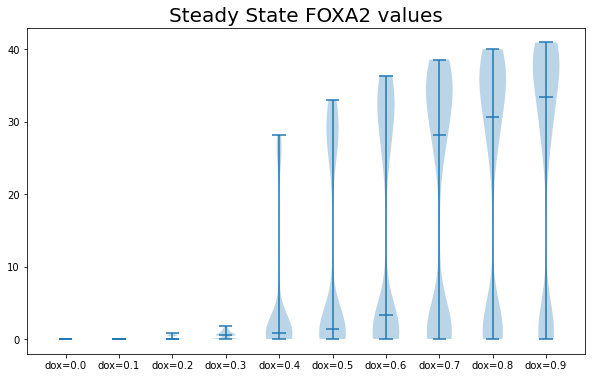

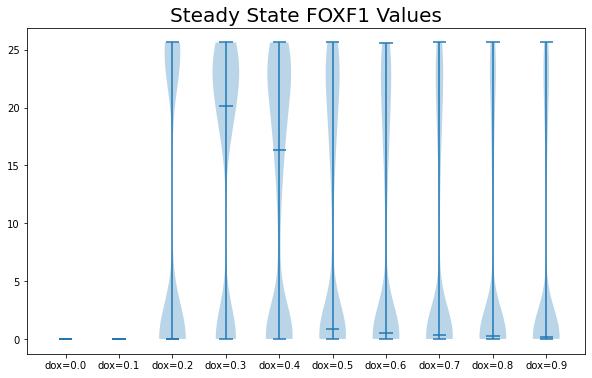

In [20]:
def write_legend(dox_values):
    a = []
    for i in dox_values:
        a.append(f'dox={i:.1f}')
    return a
dox = np.arange(0, 1, 0.1)
fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
#kwargs = dict(lw=0, alpha=0.5, bins=50, histtype='bar', stacked=True, range=[2,3])
ss_foxa2 = []
for FOXA2 in list_FOXA2:
    ss_foxa2.append(FOXA2[:,-1])
ax.violinplot(ss_foxa2, showmeans=False,showmedians=True)
plt.xticks([y + 1 for y in range(len(ss_foxa2))], labels=write_legend(dox))
ax.set_title(f'Steady State FOXA2 values', fontsize=20)


fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
#kwargs = dict(lw=0, alpha=0.5, bins=50, histtype='bar', stacked=True, range=[2,3])
ss_foxf1 = []
for FOXF1 in list_FOXF1:
    ss_foxf1.append(FOXF1[:,-1])

ax.violinplot(ss_foxf1, showmeans=False,showmedians=True)
plt.xticks([y + 1 for y in range(len(ss_foxf1))], labels=write_legend(dox))
ax.set_title(f'Steady State FOXF1 Values', fontsize=20)

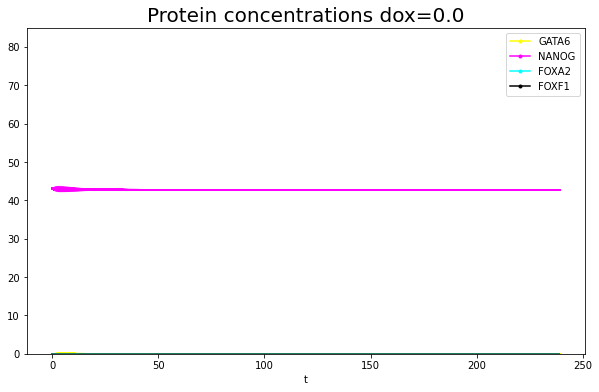

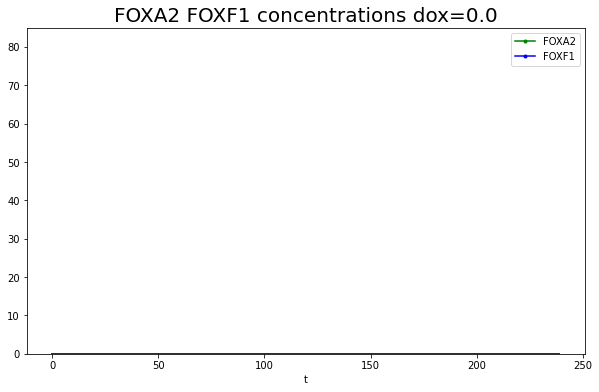

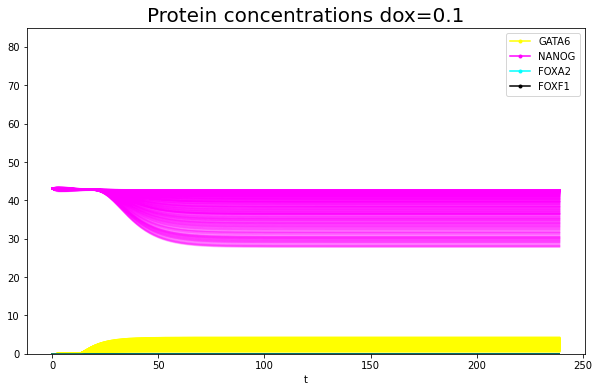

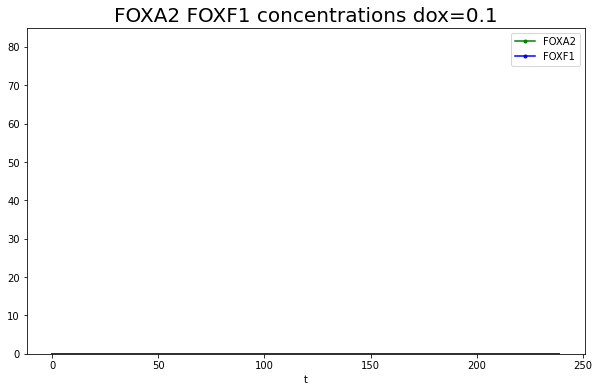

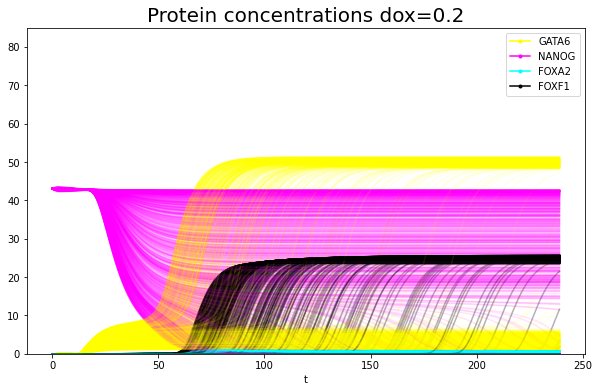

...

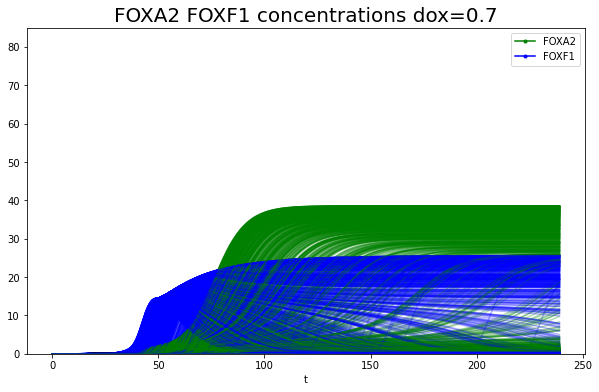

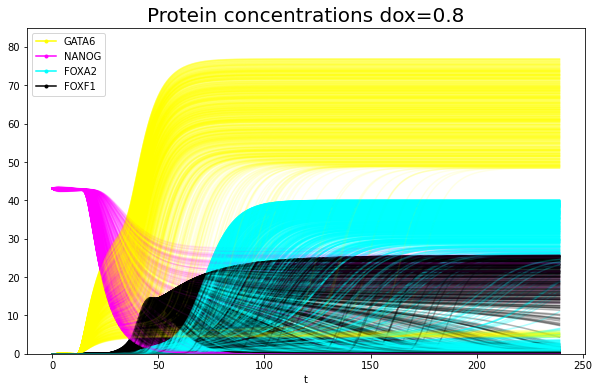

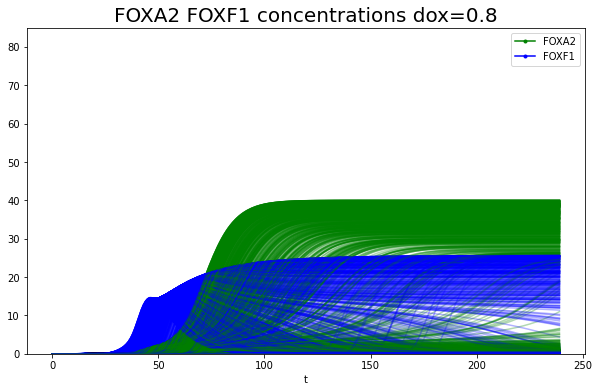

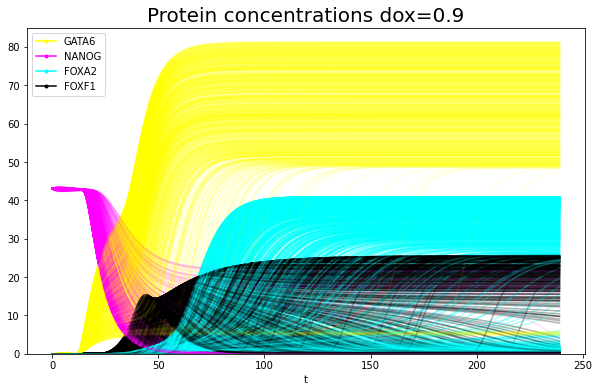

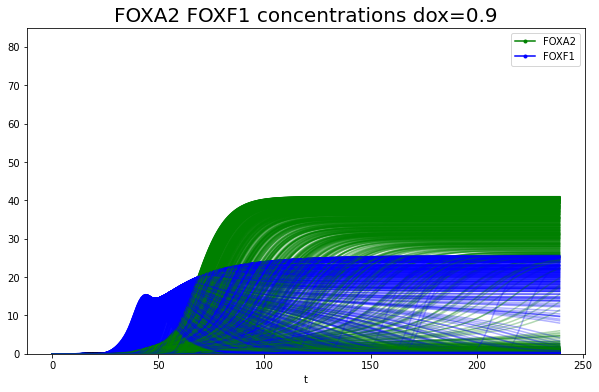

In [21]:
dox = np.arange(0, 1, 0.1)
for j in range(len(list_GATA6)):
    GATA6 = list_GATA6[j]
    NANOG = list_NANOG[j]
    FOXA2 = list_FOXA2[j]
    FOXF1 = list_FOXF1[j]
    foxa2_rna = list_foxa2_rna[j]
    foxf1_rna = list_foxf1_rna[j]
    fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
    for i in range(num_cells):
        ax.plot(t, GATA6[i,:], color='yellow', alpha=0.1)
        ax.plot(t, NANOG[i,:], color ='magenta', alpha=0.1)
        ax.plot(t, FOXA2[i,:], color='cyan', alpha=0.3)
        ax.plot(t, FOXF1[i,:], color='black', alpha=0.3)
    ax.set_title(f'Protein concentrations dox={dox[j]:.1f}', fontsize=20)
    ax.set_ylim([0, 85])
    ax.set_xlabel('t')
    plt.legend(['GATA6', 'NANOG', 'FOXA2', 'FOXF1'], handler_map={plt.Line2D: HandlerLine2D(update_func=change_alpha)})
    plt.savefig(f'./ode_figures/all_proteins_MesoEndo_RD1_v2_dox={dox[j]:.1f}.png')    

    
    fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
    for i in range(num_cells):
        ax.plot(t, FOXA2[i,:], color='g', alpha=0.3)
        ax.plot(t, FOXF1[i,:], color ='blue', alpha=0.3)
    ax.set_title(f'FOXA2 FOXF1 concentrations dox={dox[j]:.1f}', fontsize=20)
    ax.set_ylim([0, 85])
    ax.set_xlabel('t')
    plt.legend(['FOXA2', 'FOXF1'], handler_map={plt.Line2D: HandlerLine2D(update_func=change_alpha)})
    plt.savefig(f'./ode_figures/FOXA2_FOXF1_MesoEndo_RD1_v2_dox={dox[j]:.1f}.png')    


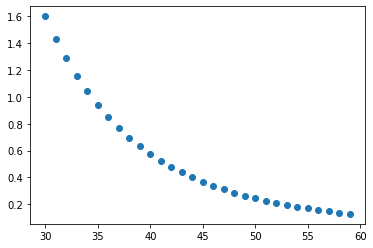

In [33]:
import numpy as np
from scipy import integrate
from matplotlib import pyplot as plt

def hill_like(x, n, k):
    return x ** n / (x ** n + k ** n)

def hill_like_integrated(xf, step_size, n, k):
    xs = np.arange(0, xf, step_size)
    return sum(hill_like(xs, n, k) * step_size)

a = []
k = np.arange(30, 60, 1)
for i in k:
    a.append(hill_like_integrated(24, 0.1, 4, i))

plt.scatter(k, a)

In [36]:
hill_like_integrated(24, 0.1, 4, 42)

0.47873566303512094

In [64]:
n = 1000
a = np.zeros(n)
for i in range(24):
    x = np.random.rand(n)
    a[x < hill_like(np.ones(n) * i, 4, 38)] = 1
print(sum(a))

502.0


In [6]:
import numpy as np
from scipy import integrate
from matplotlib import pyplot as plt
from matplotlib.legend_handler import HandlerLine2D


'''
NANOG-GATA6-FOXA2-FOXF1 MODEL with separated protein and rna
Model C V1: Add 2 I1-FFLs to regulate FOXF1 and FOXA2 production. I1-FFLs are "pulse generators" that differentially respond to
different production rates.
In this system, FOXF1 is activated at at low GATA6 and inhibited at high GATA6 via a noncompetitive inhibition function,
FOXA2 is activated by GATA6
We observe few differences in dgata6 due to the dominating hill-like equation in the system
'''

def change_alpha(handle, original):
    ''' Change the alpha and marker style of the legend handles '''
    handle.update_from(original)
    handle.set_alpha(1)
    handle.set_marker('.')

def dnanog_rna(nanog, NANOG, GATA6, a1, a2, a3, n, m, KM_NN, KM_GN):
    return (a1 * NANOG ** n)/(KM_NN ** n + NANOG ** n) * (a2 * KM_GN ** m)/(KM_GN ** m + GATA6 ** m) - a3 * nanog

def dgata6_rna(gata6, NANOG, GATA6, dox, p, a1, a2, a3, n, m, KM_GG, KM_NG):
    return dox * p + (a1 * GATA6 ** n)/(KM_GG ** n + GATA6 ** n) * (a2 * KM_NG ** m)/(KM_NG ** m + NANOG ** m) - a3 * gata6

def dx1_rna(x1, GATA6, a0, a1, n, KM_G):
    return (a0 * GATA6 ** n)/(KM_G ** n + GATA6 ** n) - a1 * x1

def dy1_rna(y1, X1, a0, a1, n, KM_X):
    return (a0 * X1 ** n)/(KM_X ** n + X1 ** n) - a1 * y1

def dz1_rna(z1, X1, Y1, a0, a1, a2, n, m, KM_X, KM_Y):
    return (a0 * X1 ** n)/(KM_X ** n + X1 ** n) - a1 * z1 - (a2 * Y1 ** m)/(KM_Y ** m + Y1 ** m) * z1

def dfoxa2_rna(foxa2, Z1, FOXA2, a0, a1, a2, n, m, KM_A2):
    return a0 * Z1 + (a1 * FOXA2 ** n)/(KM_A2 ** n + FOXA2 ** n) - a2 * foxa2

def dX1(X1, x1, a1, a2):
    return a1 * x1 - a2 * X1

def dY1(Y1, y1, a1, a2):
    return a1 * y1 - a2 * Y1

def dZ1(Z1, z1, a1, a2):
    return a1 * z1 - a2 * Z1

def dNANOG(NANOG, nanog, a1, a2):
    return a1 * nanog - a2 * NANOG

def dGATA6(GATA6, gata6, a1, a2):
    return a1 * gata6 - a2 * GATA6

def dFOXA2(FOXA2, foxa2, a1, a2):
    return a1 * foxa2 - a2 * FOXA2

def dudt(U, t, dox, p):
    nanog, gata6, x1, y1, z1, foxa2, NANOG, GATA6, X1, Y1, Z1, FOXA2 = U
    a0 = 3
    b0 = 3
    a1 = 4
    b1 = 4
    a2 = 4
    b2 = 4
    a3 = 0.5
    b3 = 0.5
    KM_NN, KM_GN, KM_GG, KM_NG, KM_11, KM_22, KM_12, KM_21 = [5, 5, 5, 5, 5, 5, 5, 5]
    KM_G1, KM_G2, KM_GI = [55, 55, 70]
    n = m = 4
    gata6_n = 8
    fox_n = 2

    protein_degradation_rate = 0.125
    translation_rate = 0.167

    d = 0
    if t > 12:
        d = dox
    dnanog_dt = dnanog_rna(nanog, NANOG, GATA6, a1, a2, a3, n, m, KM_NN, KM_GN)
    dgata6_dt = dgata6_rna(gata6, NANOG, GATA6, d, p, b1, b2, b3, n, m, KM_GG, KM_NG)
    dGATA6_dt = dGATA6(GATA6, gata6, translation_rate, protein_degradation_rate)
    dNANOG_dt = dNANOG(NANOG, nanog, translation_rate, protein_degradation_rate)
    
    dx1_dt = dx1_rna(x1, GATA6, a0, a3, n, KM_11)
    dy1_dt = dy1_rna(y1, X1, a0, a3, n, KM_11)
    dz1_dt = dz1_rna(z1, X1, Y1, a0, a1, a3, n, m, KM_12, KM_G2)
    dX1_dt = dX1(X1, x1, protein_degradation_rate, translation_rate)
    dY1_dt = dY1(Y1, y1, protein_degradation_rate, translation_rate)
    dZ1_dt = dZ1(Z1, z1, protein_degradation_rate, translation_rate)
    
    dfoxa2_dt = dfoxa2_rna(foxa2, GATA6, FOXA2, b0, b1, b3, gata6_n, fox_n, KM_22)
    dFOXA2_dt = dFOXA2(FOXA2, foxa2, translation_rate, protein_degradation_rate)
    return dnanog_dt, dgata6_dt, dx1_dt, dy1_dt, dz1_dt, dfoxa2_dt, dNANOG_dt, dGATA6_dt, dX1_dt, dY1_dt, dZ1_dt, dFOXA2_dt


dox = np.arange(0, 1, 0.1)
list_FOXF1 = []
list_X1 = []
list_Y1 = []
list_Z1 = []
list_x1 = []
list_y1 = []
list_z1 = []
list_FOXA2 = []
list_foxf1_rna = []
list_foxa2_rna = []
list_GATA6 = []
list_gata6_rna = []
list_NANOG = []
list_nanog_rna = []
list_dGATA6_dt = []

#dox = [0]
tf = 240
num_cells = 1000
for value in dox:
    t = np.arange(0, tf, 1)
    

    FOXF1 = np.zeros((num_cells, len(t)))
    foxf1_rna = np.zeros((num_cells, len(t)))
    X1 = np.zeros((num_cells, len(t)))
    Y1 = np.zeros((num_cells, len(t)))
    Z1 = np.zeros((num_cells, len(t)))
    x1_rna = np.zeros((num_cells, len(t)))
    y1_rna = np.zeros((num_cells, len(t)))
    z1_rna = np.zeros((num_cells, len(t)))
    FOXA2 = np.zeros((num_cells, len(t)))
    foxa2_rna = np.zeros((num_cells, len(t)))
    
    GATA6 = np.zeros((num_cells, len(t)))
    gata6_rna = np.zeros((num_cells, len(t)))
    nanog_rna = np.zeros((num_cells, len(t)))
    NANOG = np.zeros((num_cells, len(t)))
    
    
    dGATA6_dt = np.zeros((num_cells, len(t)))
    for i in range(num_cells):
        p = np.random.uniform(2, 16)
        nanog_initial = np.random.normal(32)
        gata6_initial = np.random.rand() * 0.15
        NANOG_initial = 43
        GATA6_initial = 0
        x1_initial = 0
        y1_initial = 0
        z1_initial = 0
        X1_initial = 0
        Y1_initial = 0
        Z1_initial = 0
        foxa2_initial = 0
        FOXA2_initial = 0
        U = [nanog_initial, gata6_initial, x1_initial, y1_initial, z1_initial, foxa2_initial, NANOG_initial, GATA6_initial, X1_initial, Y1_initial, Z1_initial, FOXA2_initial]
        values = integrate.odeint(dudt, U, t, args=(value, p))
        nanog_rna[i,:], gata6_rna[i,:], x1_rna[i,:], y1_rna[i,:], z1_rna[i,:], foxa2_rna[i,:] = values[:,0], values[:,1], values[:,2], values[:,3], values[:,4], values[:,5]
        NANOG[i,:], GATA6[i,:], X1[i,:], Y1[i,:], Z1[i,:], FOXA2[i,:] = values[:,6], values[:,7], values[:,8], values[:,9], values[:,10], values[:,11]
    list_gata6_rna.append(gata6_rna)
    list_GATA6.append(GATA6)
    list_NANOG.append(NANOG)
    list_nanog_rna.append(nanog_rna)
    list_x1.append(x1_rna)
    list_y1.append(y1_rna)
    list_z1.append(z1_rna)
    list_X1.append(X1)
    list_Y1.append(Y1)
    list_Z1.append(Z1)
    #list_FOXF1.append(FOXF1)
    list_FOXA2.append(FOXA2)
    #list_foxf1_rna.append(foxf1_rna)
    list_foxa2_rna.append(foxa2_rna)

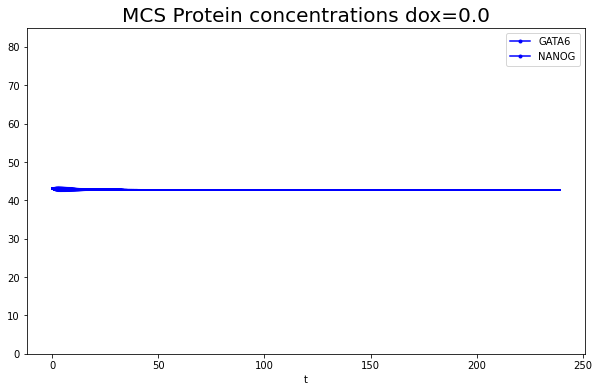

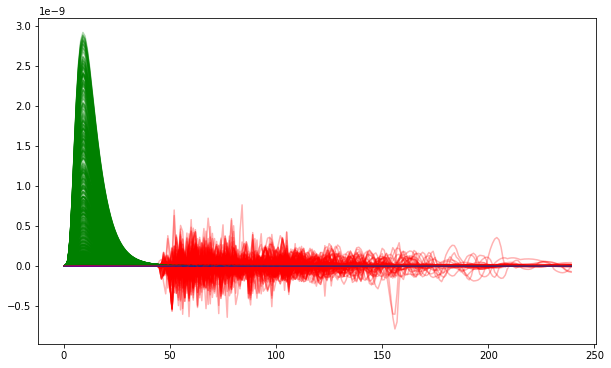

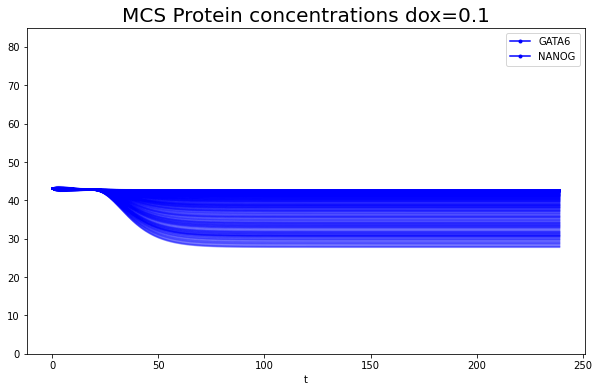

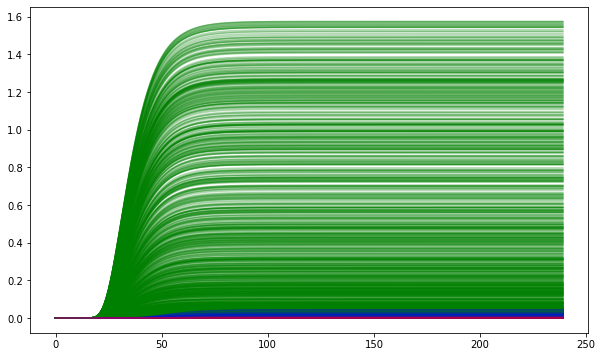

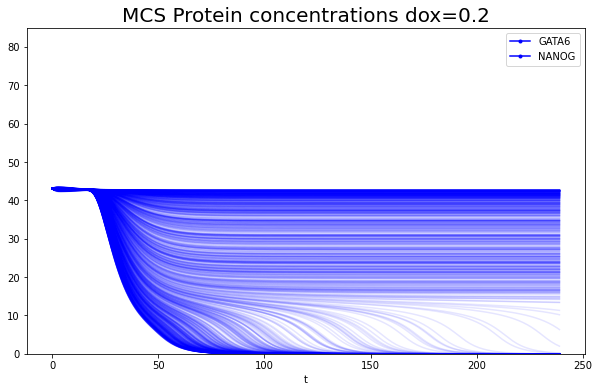

...

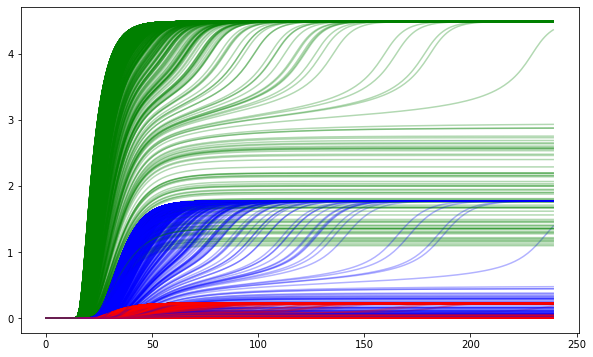

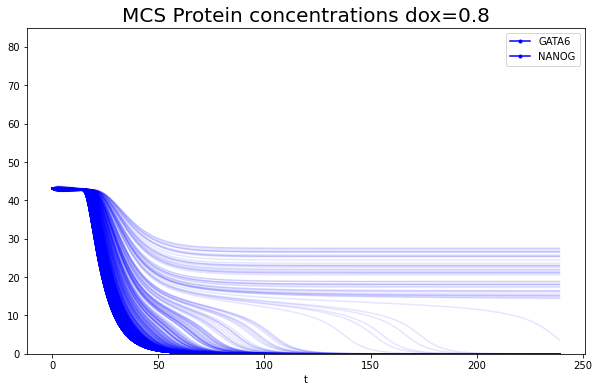

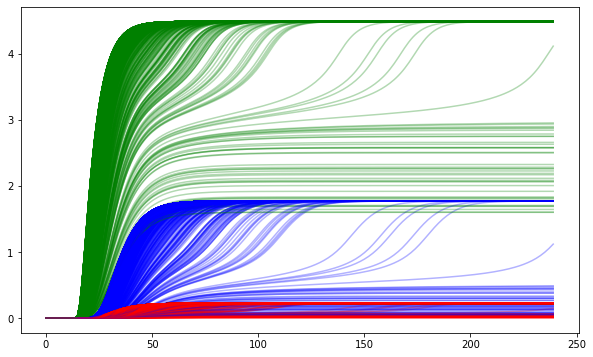

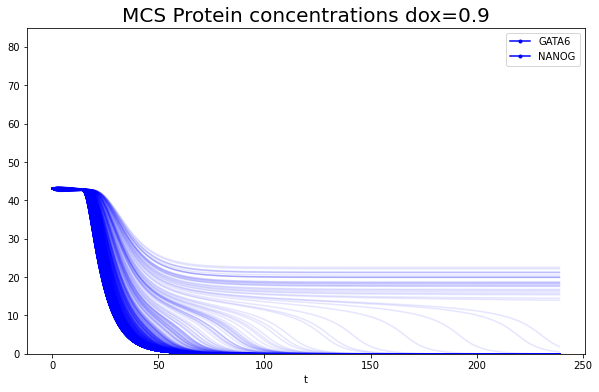

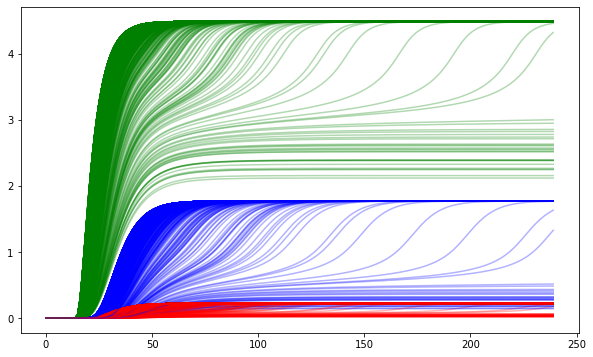

In [18]:
dox = np.arange(0, 1, 0.1)
for j in range(len(list_NANOG)):
    #GATA6 = list_GATA6[j]
    NANOG = list_NANOG[j]
    FOXA2 = list_FOXA2[j]
    X1 = list_X1[j]
    Y1 = list_Y1[j]
    Z1 = list_Z1[j]
    foxa2_rna = list_foxa2_rna[j]
    #foxf1_rna = list_foxf1_rna[j]
    fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
    for i in range(num_cells):
        #ax.plot(t, GATA6[i,:], color='green', alpha=0.1)
        ax.plot(t, NANOG[i,:], color ='blue', alpha=0.1)
    ax.set_title(f'MCS Protein concentrations dox={dox[j]:.1f}', fontsize=20)
    ax.set_ylim([0, 85])
    ax.set_xlabel('t')
    plt.legend(['GATA6', 'NANOG'], handler_map={plt.Line2D: HandlerLine2D(update_func=change_alpha)})
    fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
    for i in range(num_cells):
        ax.plot(t, X1[i,:], color='green', alpha=0.3)
        ax.plot(t, Y1[i,:], color='blue', alpha=0.3)
        ax.plot(t, Z1[i,:], color='red', alpha=0.3)


[array([[ 0.00000000e+00,  1.56422065e-12,  3.99440423e-11, ...,
        -3.54104706e-20, -2.90861187e-20, -2.25135905e-20],
       [ 0.00000000e+00,  5.72900843e-13,  1.46254894e-11, ...,
         2.14340030e-21,  2.93889998e-21,  8.42240357e-22],
       [ 0.00000000e+00,  4.80163738e-13,  1.22582587e-11, ...,
        -2.18656853e-19, -2.13942221e-19, -2.00254940e-19],
       ...,
       [ 0.00000000e+00,  7.47495460e-14,  1.90922469e-12, ...,
         1.65676794e-21,  1.66017188e-21,  1.65718804e-21],
       [ 0.00000000e+00,  1.62070185e-13,  4.13863572e-12, ...,
        -1.30237476e-20, -1.39386220e-20, -1.45859194e-20],
       [ 0.00000000e+00,  1.58561225e-14,  4.05277719e-13, ...,
        -7.00477662e-21, -6.44022762e-21, -5.76367937e-21]]), array([[0.00000000e+00, 1.30038049e-12, 3.31944250e-11, ...,
        7.82263895e-01, 7.82263895e-01, 7.82263895e-01],
       [0.00000000e+00, 4.82505213e-13, 1.23180280e-11, ...,
        4.51602995e-03, 4.51602995e-03, 4.51602995e-03],
     